In [61]:
import sys
sys.path.append('/gpfs/home/loconno3/utra2023/code') 
import mocap_functions
import numpy as np
import pandas as pd
import neo
import matplotlib.pyplot as plt
import scipy.io as sio
from scipy import signal
from scipy.interpolate import interp1d
import spike_train_functions
import elephant
import quantities as pq
# import h5py
from sklearn.model_selection import ShuffleSplit
from sklearn.linear_model import LinearRegression
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import torch as torch
from torch import nn
import torch.nn.functional as F
from joblib import Parallel, delayed
import multiprocessing
import Neural_Decoding
import pickle
import seaborn as sns
import math
from scipy.stats import kruskal
sns.set()
sns.set_style("white")

num_cores = multiprocessing.cpu_count()
scaler = StandardScaler()

# CUDA for PyTorch
use_cuda = torch.cuda.is_available()
#device = torch.device("cuda:0")
device = torch.device('cpu')

torch.backends.cudnn.benchmark = True

In [4]:
video_path = '../data/SPK20220308/motion_tracking'

pos_fnames = f'{video_path}/Spike03-08-1557_DLC3D_resnet50_DLCnetwork3D_Spike03-08-1557Sep7shuffle1_500000_AllCam.csv'

eyes_path = f'{video_path}/SpikeCam5_EYES_03-08-1557DLC_resnet50_DLC-eyesNov4shuffle1_40000_el.csv'

## Load Raw Data

In [5]:
pos_df = pd.read_csv(f'{video_path}/SpikeCam1_03-08-1557_cam1DLC_resnet50_DLCnetwork3D_Spike03-08-1557Sep16shuffle1_750000_filtered.csv')
pos_df.columns = [f'{pos_df.iloc[0,i]}_{pos_df.iloc[1,i]}' for i in range(len(pos_df.columns))]
pos_df = pos_df.iloc[2:].astype(float)

/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3457: DtypeWarning: Columns (0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [6]:
# cam_df = pd.read_csv(pos_fnames)
cam_df = pos_df
# Subtract wrist marker from fingers
forelimb_markers = ['carpal', 'radiusProx', 'radiusDistal', 'ulnarProx', 'ulnarDistal']
wrist_marker = 'carpal'
forelimb_mask = np.logical_or.reduce([cam_df.columns.str.contains(pat=pat) for pat in forelimb_markers])
finger_mask = np.invert(forelimb_mask)

for marker_name in cam_df.columns[finger_mask]:
    if '_x' in marker_name:
        cam_df[marker_name] = cam_df[marker_name] - cam_df[f'{wrist_marker}_x']
    elif '_y' in marker_name:
        cam_df[marker_name] = cam_df[marker_name] - cam_df[f'{wrist_marker}_y']
        
# Calculate grip aperture
cam_df['grip_aperture'] = np.sqrt(
    np.square(cam_df['thumbDistal_x'] - cam_df['indexProx_x']) + 
    np.square(cam_df['thumbDistal_y'] - cam_df['indexProx_y']))

# Load eyes and concatenate marker information into column names from first 3 rows
eyes_df = pd.read_csv(eyes_path, header=[1,2,3]).iloc[:,1:]
eyes_df.columns = ['_'.join(eyes_df.columns[idx]) for idx in range(len(eyes_df.columns))]

# Add columns from eyes_df
cam_df = pd.concat([cam_df, eyes_df], axis=1)

pos_mask = np.logical_or.reduce((cam_df.columns.str.contains(pat='_x'), cam_df.columns.str.contains(pat='_y'), 
                                 cam_df.columns.str.contains(pat='_z')))
marker_names = cam_df.columns[pos_mask].values.tolist()

In [7]:
# Inspect proportion of NaNs where tracking lost
null_percent = cam_df.isnull().astype(int).sum().values / len(cam_df)
sort_indices = np.argsort(null_percent)[::-1]

for name, val in zip(cam_df.columns[sort_indices], null_percent[sort_indices]):
    print(f'| {name} {np.round(val, 2)}', end=' ')

| righteye_pupiltop_x 0.65 | righteye_pupiltop_y 0.65 | lefteye_pupiltop_x 0.43 | lefteye_pupiltop_y 0.43 | single_cornealRefR_likelihood 0.26 | single_cornealRefR_x 0.26 | single_cornealRefR_y 0.26 | righteye_pupiloutside_y 0.1 | righteye_pupiloutside_x 0.1 | righteye_pupilcenter_y 0.09 | righteye_pupilcenter_x 0.09 | righteye_pupilinside_x 0.09 | righteye_pupilinside_y 0.09 | lefteye_pupilinside_x 0.08 | lefteye_pupilinside_y 0.08 | righteye_pupilbottom_x 0.08 | righteye_pupilbottom_y 0.08 | righteye_outsideeye_y 0.07 | righteye_outsideeye_x 0.07 | righteye_insideeye_x 0.07 | righteye_insideeye_y 0.07 | righteye_pupilinside_likelihood 0.07 | righteye_pupilbottom_likelihood 0.07 | righteye_pupilcenter_likelihood 0.07 | righteye_insideeye_likelihood 0.07 | righteye_pupiltop_likelihood 0.07 | righteye_outsideeye_likelihood 0.07 | righteye_pupiloutside_likelihood 0.07 | lefteye_pupiloutside_y 0.07 | lefteye_pupiloutside_x 0.07 | lefteye_pupilbottom_y 0.05 | lefteye_pupilbottom_x 0.05 | l

In [8]:
# Set threshold for likelihood
score_threshold = 0.5

# Pull out marker names stripped of suffix (only markers have scores and likelihood DLC variables)
score_mask = cam_df.columns.str.contains(pat='_x')
score_names = cam_df.columns[score_mask].values
marker_names_stripped = cam_df.columns[score_mask].str.split('_').str[:-1].str.join('_').values


# marker_pos_names indicates which vars are stored in kinematic_df. Only append _x, _y, _z markers
marker_pos_names = list()
for mrk_name in marker_names_stripped:
    # Separate likelihood and position data for 
    mrk_score_mask = np.logical_and(cam_df.columns.str.contains(pat=mrk_name), 
                                    np.logical_or(cam_df.columns.str.contains(pat='error'), 
                                                  cam_df.columns.str.contains(pat='likelihood')))
    mrk_pos_mask = np.logical_and(cam_df.columns.str.contains(pat=mrk_name), 
                                    np.logical_or.reduce((cam_df.columns.str.contains(pat='_x'), 
                                                          cam_df.columns.str.contains(pat='_y'),
                                                          cam_df.columns.str.contains(pat='_z'))))   
    # There should only be 1 likelihood variable, and 2 or 3 position variables
    assert np.sum(mrk_score_mask) == 1
    assert np.sum(mrk_pos_mask) == 2 or np.sum(mrk_pos_mask) == 3
    mrk_score_name = cam_df.columns[mrk_score_mask].values[0]
    pos_name_list = cam_df.columns[mrk_pos_mask].values.tolist()
    marker_pos_names.extend(pos_name_list)

    score_data = cam_df[mrk_score_name].values
    threshold_mask = score_data < score_threshold

    # Set position data values to zero if likelihood below threshold
    for pos_name in pos_name_list:
        pos_data = cam_df[pos_name]
        pos_data[threshold_mask] = 0.0

        # Remove nans (need to test with interpolation)
        pos_data = np.nan_to_num(pos_data, copy=True, nan=0.0)
        
        # Update dataframe
        cam_df[pos_name] = pos_data

In [9]:
cb_dict = dict()
unit_idx = 0
for cb_idx in range(1,3):
    #Use neo module to load blackrock files
    fpath = '../data/SPK20220308/task_data/'
    # TODO: Fix this
    if cb_idx == 1:
        experiment_dict = sio.loadmat(f'{fpath}eventsCB{cb_idx}_corrected2.mat')
    else:
        experiment_dict = sio.loadmat(f'{fpath}SPKRH20220308_CB{cb_idx}_ev_explicit.mat')
    nev = neo.io.BlackrockIO(f'{fpath}SPKRH20220308_CB{cb_idx}_quiver4toyPKPK4Rotation_delay_001_RETVR_DSXII_corrected.nev')
    ns2 = neo.io.BlackrockIO(f'{fpath}SPKRH20220308_CB{cb_idx}_quiver4toyPKPK4Rotation_delay_001.ns2')

    sampling_rate_list = ns2.header['signal_channels'][['name','sampling_rate']]
    sampling_rate = 30000
    analog_sampling_rate = 1000
    eye_sampling_rate = 500
    camera_sampling_rate = 40

    #nev seg holds spike train information to extract
    nev_seg = nev.read_segment()
    tstart = nev_seg.t_start.item()
    tstop = nev_seg.t_stop.item()

    #Group spiketrain timestamps by unit id
    unit_timestamps = dict()
    for st in nev_seg.spiketrains:
        if st.annotations['unit_id'] == 1:
            unit_timestamps[unit_idx] = st.times
            unit_idx += 1

    #Grab indeces for camera frames
    cam_trigger = ns2.get_analogsignal_chunk(channel_names=['FlirCam']).transpose()[0]
    num_analog_samples = len(cam_trigger)
    trigger_val = 18000 #threshold where rising edge aligns frame, may need to tweak
    cam_frames = np.flatnonzero((cam_trigger[:-1] < trigger_val) & (cam_trigger[1:] > trigger_val))+1

    cb_dict[f'cb{cb_idx}'] = {'tstart': tstart, 'tstop': tstop, 'unit_timestamps': unit_timestamps,
                              'cam_frames': cam_frames, 'experiment_dict': experiment_dict}


In [10]:
experiment_dict = cb_dict['cb1']['experiment_dict']
cam_frames =  cb_dict['cb1']['cam_frames']

analog_sampling_rate = 1000
cam_start = cam_frames[0] / analog_sampling_rate

#Load variables from struct (struct indexing is unfortunately hideous)
#ev_ex = experiment_dict['df']
ev_ex = experiment_dict['eventsCB1']
gocON = ev_ex['gocON'][0][0][0]
#gocOFF = ev_ex['gocOFF'][0][0][0]
stmv = ev_ex['stmv'][0][0][0]
contact = ev_ex['contact_C'][0][0][0]
end_hold = ev_ex['endhold_C'][0][0][0]
layout = ev_ex['LAYOUT_C'][0][0][0] # Inserts layout into dataframe
position = ev_ex['POSITION_C'][0][0][0]

# Google slide(?) w example of spike and contact with video frame
# cam_frames should be aligned with video: find index in cam frame closest to contact time
# Look for end_lift: sensor detect when pulled, not just when touched

#reward = ev_ex['reward'][0][0][0]
#error = ev_ex['error'][0][0][0]


In [11]:
#Define game event for alignment, and window around marker
event_ts = end_hold
#event_ts = event_ts[event_ts < 1000] # events less than 1000 seconds for short DLC tracking
# CHANGE BACK TO [-1,0]!!!!!!!!!!!!!!!!!!!!!!
e_start, e_stop = [-1,0]
num_events = len(event_ts)

Identify task dependent neurons:

In [12]:
e_start_intertrial, e_stop_intertrial = [-.5,0]
e_start_trial, e_stop_trial = [0, 0.5]
trial_ts = stmv
num_events_baseline = len(trial_ts)

In [13]:
# Find scale/timeshift between CB1 and CB2
cb2_align_ts = cb_dict['cb2']['experiment_dict']['df']['gocON'][0][0][0]
assert len(cb2_align_ts) == len(gocON) 
cb2_start, cb2_end = cb2_align_ts[0], cb2_align_ts[-1]

ts_shift = gocON[0] - cb2_start 
ts_scale = (cb2_end - cb2_start) / (gocON[-1] -  gocON[0])


In [14]:
unit_timestamps = cb_dict['cb1']['unit_timestamps'].copy()

# Shift and scale time stamps between the two machines
unit_timestamps_cb2 = cb_dict['cb2']['unit_timestamps'].copy()
unit_timestamps_cb2_corrected = dict()
for unit_idx, unit_ts in unit_timestamps_cb2.items():
    ts_corrected = (unit_ts + ts_shift * (pq.s)) / (ts_scale * pq.s)
    unit_timestamps_cb2_corrected[unit_idx] = ts_corrected


unit_timestamps.update(unit_timestamps_cb2_corrected)


Compile the non-trial data: ASK ABOUT THIS! KINDA SUS

In [15]:
#Append convolved firing rates to dataframe
kernel_halfwidth = 0.250 #in seconds
kernel = elephant.kernels.RectangularKernel(sigma=kernel_halfwidth/np.sqrt(3)*pq.s)  #***** Change if you want Carlos
sampling_period = 0.01*pq.s
window_length = int((e_stop-e_start)/(sampling_period).item())
    
#List to store neural data
rate_col_trial = list()
rate_col_intertrial = list()

unit_col = list()

trial_col_neural = list()

layout_col_neural = list()

position_col_neural = list()


for e_idx, e_ts in list(enumerate(trial_ts))[:218]:
    print(e_idx, end=' ')
    
    #Load neural data
    # use as its own 2d matrix
    unit_rate = list()
    for unit_idx, unit_ts in unit_timestamps.items():
        
        rate_trial = spike_train_functions.spike_train_rates(unit_ts, e_ts+e_start_trial, e_ts+e_stop_trial, sampling_rate, kernel, sampling_period).transpose()
        rate_intertrial = spike_train_functions.spike_train_rates(unit_ts, e_ts+e_start_intertrial, e_ts+e_stop_intertrial, sampling_rate, kernel, sampling_period).transpose()
    
        rate_col_trial.append(rate_trial)
        rate_col_intertrial.append(rate_intertrial)
        
        trial_col_neural.append(e_idx)
        layout_col_neural.append(layout[e_idx])
        unit_col.append(unit_idx)
        position_col_neural.append(position[e_idx])

        
#Pickle convolved rates
intertrial_neural_dict = {'rates':rate_col_intertrial, 'unit':unit_col, 'trial':trial_col_neural, 'layout': layout_col_neural, 'position':position_col_neural}
intertrial_neural_df = pd.DataFrame(intertrial_neural_dict)
intertrial_neural_df['count'] = intertrial_neural_df['rates'].apply(np.sum)


trial_neural_dict = {'rates':rate_col_trial, 'unit':unit_col, 'trial':trial_col_neural, 'layout': layout_col_neural, 'position':position_col_neural}
trial_neural_df = pd.DataFrame(trial_neural_dict)
trial_neural_df['count'] = trial_neural_df['rates'].apply(np.sum)

0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216 217 

In [20]:
#Append convolved firing rates to dataframe
kernel_halfwidth = 0.250 #in seconds
kernel = elephant.kernels.RectangularKernel(sigma=kernel_halfwidth/np.sqrt(3)*pq.s)  #***** Change if you want Carlos
sampling_period = 0.01*pq.s
window_length = int((e_stop-e_start)/(sampling_period).item())
    
#List to store neural data
rate_col = list()
unit_col = list()
trial_col_neural = list()
layout_col_neural = list()
position_col_neural = list()

#List to store kinematic data
posData_col = list()
name_col = list()
trial_col_kinematic = list()
layout_col_kinematic = list()
position_col_kinematic = list()

#List to store video data
timeStamps_col = list()
trial_col_video = list()
layout_col_video = list()
position_col_video = list()

kinematic_metadata = dict()
neural_metadata = dict()
for e_idx, e_ts in enumerate(event_ts):
    print(e_idx, end=' ')
    
    #Load kinematic data
    #Identify which frames fall in the time window
    frame_mask = np.logical_and(cam_frames > ((e_ts+e_start) * analog_sampling_rate), cam_frames < ((e_ts+e_stop) * analog_sampling_rate))
    frame_idx = np.flatnonzero(frame_mask) #Pull out indeces of valid frames
    kinematic_metadata[e_idx] = {'time_data':np.linspace(e_ts+e_start, e_ts+e_stop, window_length)}
    
    for mkr in marker_pos_names:
        marker_pos = cam_df[mkr].values[frame_idx]
        f = interp1d(np.linspace(0,1,marker_pos.size), marker_pos)
        marker_interp = f(np.linspace(0,1,window_length))
        
        posData_col.append(marker_interp)
        name_col.append(mkr)
        trial_col_kinematic.append(e_idx)
        layout_col_kinematic.append(layout[e_idx])
        
        position_col_kinematic.append(position[e_idx])
    
    #Load neural data
    # use as its own 2d matrix
    unit_rate = list()
    for unit_idx, unit_ts in unit_timestamps.items():
        rate = spike_train_functions.spike_train_rates(unit_ts, e_ts+e_start, e_ts+e_stop, sampling_rate, kernel, sampling_period).transpose()
        
        rate_col.append(rate)
        trial_col_neural.append(e_idx)
        layout_col_neural.append(layout[e_idx])
        unit_col.append(unit_idx)
        neural_metadata[e_idx] = {'time_data':frame_idx}
        position_col_neural.append(position[e_idx])
    # all_rates.append(unit_rate)

    timeStamps_col.append(np.linspace(e_ts+e_start, e_ts+e_stop, window_length))
    trial_col_video.append(e_idx)
    layout_col_video.append(layout[e_idx])
    position_col_video.append(position[e_idx])
        
#Pickle convolved rates
neural_dict = {'rates':rate_col, 'unit':unit_col, 'trial':trial_col_neural, 'layout': layout_col_neural, 'position':position_col_neural}
neural_df = pd.DataFrame(neural_dict)
neural_df['count'] = neural_df['rates'].apply(np.sum)


kinematic_dict = {'name':name_col, 'posData':posData_col, 'trial':trial_col_kinematic, 'layout': layout_col_kinematic, 'position':position_col_kinematic}
kinematic_df = pd.DataFrame(kinematic_dict)

video_dict = {'timeStamps':timeStamps_col, 'trial': trial_col_video, 'layout': layout_col_video, 'position': position_col_video}
video_df = pd.DataFrame(video_dict)

metadata={'kinematic_metadata':kinematic_metadata, 'neural_metadata':neural_metadata, 'num_trials':num_events, 'kernel_halfwidth':kernel_halfwidth}


0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216 217 

In [21]:
# Gets the average binned firing rate for each neuron during the trial period
neural_datalist = []
for unit in range(87):
    neural_datalist.append(np.stack(trial_neural_df['rates'][trial_neural_df['unit'] == unit].values).squeeze().transpose())
trial_avgs = np.mean(np.array(neural_datalist).reshape((87,-1)), axis=1)

In [22]:
# Gets the average binned firing rate for each neuron during the trial period
baseline_neural_datalist = []
for unit in range(87):
    baseline_neural_datalist.append(np.stack(intertrial_neural_df['rates'][intertrial_neural_df['unit'] == unit].values).squeeze().transpose())
nontrial_avgs = np.mean(np.array(baseline_neural_datalist).reshape((87,-1)), axis=1)
np.allclose(neural_datalist, baseline_neural_datalist)

False

(63,)


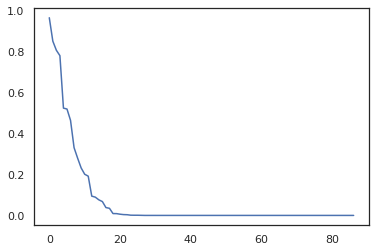

In [23]:
# Using Kruskal-Wallis
nontrial_data = np.array(baseline_neural_datalist)
trial_data = np.array(neural_datalist)
p_vals = []
#sum along trials dim
for i in range(87):
    p_vals.append(kruskal(np.mean(nontrial_data[i], axis=0), np.mean(trial_data[i], axis=0)).pvalue)

threshold = 0.001
task_dependent_units = np.where(np.array(p_vals) < threshold)[0]

plt.plot(np.sort(p_vals)[::-1])
print(task_dependent_units.shape)

In [63]:
len(task_dependent_units)

63

In [24]:
#Save DataFrames to temporary folder
kinematic_df.to_pickle(fpath + 'kinematic_df.pkl')
neural_df.to_pickle(fpath + 'neural_df.pkl')
video_df.to_pickle(fpath + 'video_df.pkl')

#Save metadata
output = open(fpath + 'metadata.pkl', 'wb')
pickle.dump(metadata, output)
output.close()

## Visualize Data

Text(0, 0.5, 'Marker position')

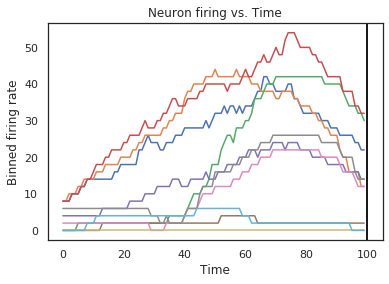

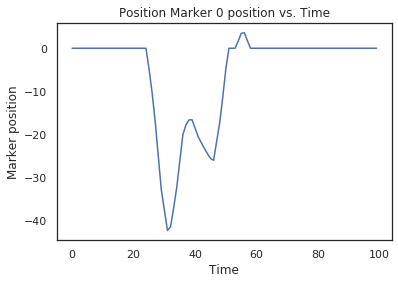

In [25]:
# Number of plots
n = 10

for i in range(n):
    plt.plot(neural_df['rates'].values[i].squeeze())
    plt.title('Neuron firing vs. Time')
    plt.axvline(x=100, color='k')
    plt.xlabel('Time')
    plt.ylabel('Binned firing rate')

plt.figure()
plt.title('Position Marker 0 position vs. Time')
plt.plot(kinematic_df['posData'].values[0].squeeze())
plt.xlabel('Time')
plt.ylabel('Marker position')

In [20]:
kinematic_df.iloc[0,1].shape

(100,)

In [21]:
kinematic_df

,name,posData,trial,layout,position
0,thumbProx_x,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0,1,4
1,thumbProx_y,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0,1,4
2,thumbDistal_x,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0,1,4
3,thumbDistal_y,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0,1,4
4,thumbtip_x,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0,1,4
...,...,...,...,...,...
18743,lefteye_pupilbottom_y,"[538.557, 537.5792121212121, 536.6014242424243...",217,2,2
18744,lefteye_pupiloutside_x,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",217,2,2
18745,lefteye_pupiloutside_y,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",217,2,2
18746,single_cornealRefR_x,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",217,2,2


In [26]:
from scipy import interpolate
from scipy import ndimage

100
100


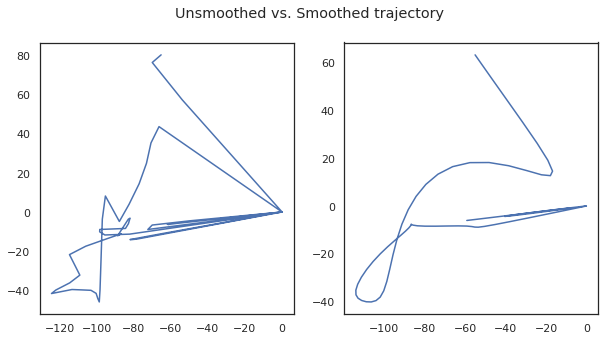

In [27]:
ring_data_x = kinematic_df[kinematic_df['name'] == 'ringProx_x'][['posData', 'position', 'layout']].squeeze() 
ring_data_y =  kinematic_df[kinematic_df['name'] == 'ringProx_y'][['posData', 'position', 'layout']].squeeze()

x = ring_data_x.iloc[0]['posData']
y = ring_data_y.iloc[0]['posData']


sigma = 3
x_g1d = ndimage.gaussian_filter1d(x, sigma)
y_g1d = ndimage.gaussian_filter1d(y, sigma)

fig, ax = plt.subplots(1,2, figsize=(10,5))
ax[0].plot(x,y)
ax[1].plot(x_g1d, y_g1d)
fig.suptitle('Unsmoothed vs. Smoothed trajectory')
print(len(x_g1d))
print(len(x))
fig.savefig('../figures/smoothed_vs_unsmoothed.svg')

In [28]:
sigma=4
smoothed_kinematic_df = kinematic_df

for i in range(len(smoothed_kinematic_df)):
    smoothed_kinematic_df.at[i, 'posData'] = ndimage.gaussian_filter1d(smoothed_kinematic_df.loc[i,'posData'], sigma)

4
4


Text(0, 0.5, 'Y position')

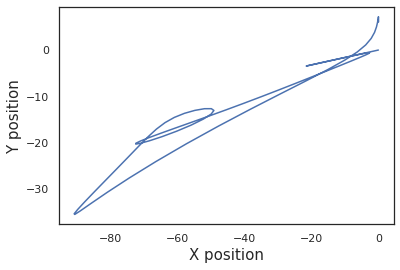

In [97]:
ring_data_x = smoothed_kinematic_df[smoothed_kinematic_df['name'] == 'ringProx_x'][['posData', 'position', 'layout']].squeeze() 
ring_data_y =  smoothed_kinematic_df[smoothed_kinematic_df['name'] == 'ringProx_y'][['posData', 'position', 'layout']].squeeze()
x = ring_data_x.iloc[1]['posData']
y = ring_data_y.iloc[1]['posData']
print(ring_data_x.iloc[1]['position'])
print(ring_data_x.iloc[1]['layout'])
plt.plot(x,y)
plt.xlabel('X position',fontsize=15)
plt.ylabel('Y position',fontsize=15)


In [111]:
ring_data_y

,posData,position,layout
23,"[53.45658761070362, 51.32416396064101, 47.3527...",4,1
109,"[6.071626546579222, 6.290158206973688, 6.64670...",4,4
195,"[-42.132350208876375, -41.05201879751395, -39....",1,2
281,"[32.204953192708416, 32.93219245393815, 34.201...",2,3
367,"[18.704916326989945, 18.201016004175756, 17.21...",3,1
...,...,...,...
18341,"[37.71702393836981, 36.1709764469825, 33.27722...",3,1
18427,"[65.55873605852213, 64.99232946860933, 63.8138...",1,1
18513,"[20.633085286931014, 19.720693779757326, 17.90...",2,4
18599,"[-17.478955062180017, -16.91299338817531, -15....",2,4


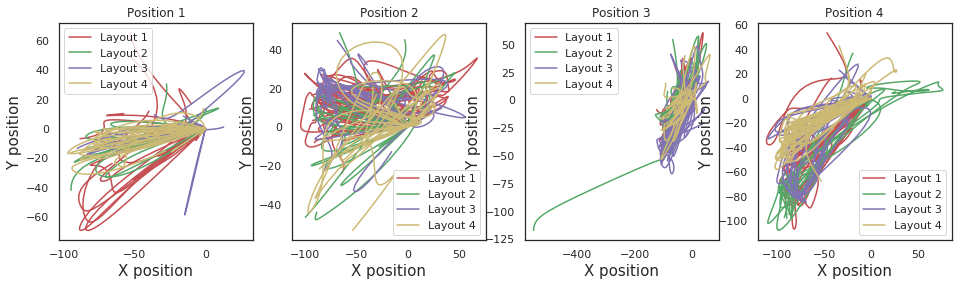

In [130]:
fig, ax = plt.subplots(1,4, figsize=(16,4))
for i in range(4):
    axis = ax[i]
    axis.set_title('Position ' + str(i+1))
    mask = pd.array(np.logical_and(ring_data_y['layout']==1, ring_data_y['position']==i+1))
    x = list(ring_data_x['posData'][mask])
    y = list(ring_data_y['posData'][mask])
    
    label='Layout 1'
    for posx, posy in zip(x,y):
        axis.plot(posx,posy, color='r', label=label)
#         axis.plot(posx[0], posy[0], color='black', marker='o')
        label = '_nolegend_'
        
    mask = pd.array(np.logical_and(ring_data_y['layout']==2, ring_data_y['position']==i+1))
    x = list(ring_data_x['posData'][mask])
    y = list(ring_data_y['posData'][mask])
    
    label = 'Layout 2'
    for posx, posy in zip(x,y):
        axis.plot(posx,posy, color='g', label=label)
#         axis.plot(posx[0], posy[0], color='black', marker='o')
        label = '_nolegend_'
    
    
    mask = pd.array(np.logical_and(ring_data_y['layout']==3, ring_data_y['position']==i+1))
    x = list(ring_data_x['posData'][mask])
    y = list(ring_data_y['posData'][mask])
    label = 'Layout 3'
    for posx, posy in zip(x,y):
        axis.plot(posx,posy, color='m', label=label)
#         axis.plot(posx[0], posy[0], color='black', marker='o')
        label = '_nolegend_'
    label = 'Layout 4'
    mask = pd.array(np.logical_and(ring_data_y['layout']==4, ring_data_y['position']==i+1))
    x = list(ring_data_x['posData'][mask])
    y = list(ring_data_y['posData'][mask])

    for posx, posy in zip(x,y):
        axis.plot(posx,posy, color='y', label=label)
#         axis.plot(posx[0], posy[0], color='black', marker='o')
        label = '_nolegend_'
    
    
    axis.set_xlabel('X position', fontsize=15)
    axis.set_ylabel('Y position', fontsize=15)
    axis.legend()
fig.savefig('../figures/kinematic_trajectories.svg')

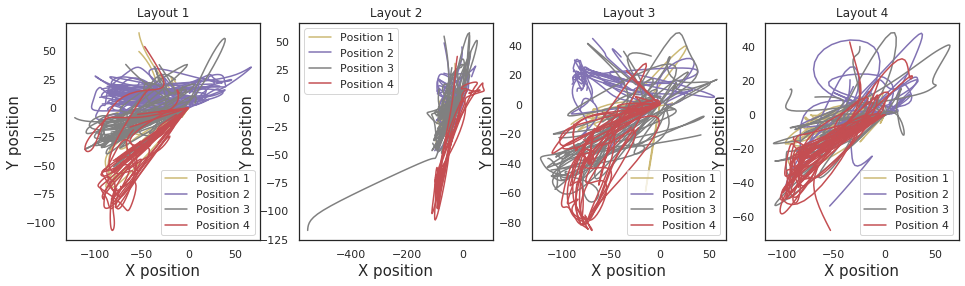

In [131]:
fig, ax = plt.subplots(1,4, figsize=(16,4))
for i in range(4):
    axis = ax[i]
    axis.set_title('Layout ' + str(i+1))
    mask = pd.array(np.logical_and(ring_data_y['layout']==i+1, ring_data_y['position']==1))
    x = list(ring_data_x['posData'][mask])
    y = list(ring_data_y['posData'][mask])
    
    label='Position 1'
    for posx, posy in zip(x,y):
        axis.plot(posx,posy, color='y', label=label)
#         axis.plot(posx[0], posy[0], color='black', marker='o')
        label = '_nolegend_'
        
    mask = pd.array(np.logical_and(ring_data_y['layout']==i+1, ring_data_y['position']==2))
    x = list(ring_data_x['posData'][mask])
    y = list(ring_data_y['posData'][mask])
    
    label = 'Position 2'
    for posx, posy in zip(x,y):
        axis.plot(posx,posy, color='m', label=label)
#         axis.plot(posx[0], posy[0], color='black', marker='o')
        label = '_nolegend_'
    
    
    mask = pd.array(np.logical_and(ring_data_y['layout']==i+1, ring_data_y['position']==3))
    x = list(ring_data_x['posData'][mask])
    y = list(ring_data_y['posData'][mask])
    label = 'Position 3'
    for posx, posy in zip(x,y):
        axis.plot(posx,posy, color='grey', label=label)
#         axis.plot(posx[0], posy[0], color='black', marker='o')
        label = '_nolegend_'
    label = 'Position 4'
    mask = pd.array(np.logical_and(ring_data_y['layout']==i+1, ring_data_y['position']==4))
    x = list(ring_data_x['posData'][mask])
    y = list(ring_data_y['posData'][mask])

    for posx, posy in zip(x,y):
        axis.plot(posx,posy, color='r', label=label)
#         axis.plot(posx[0], posy[0], color='black', marker='o')
        label = '_nolegend_'
    
    
    axis.set_xlabel('X position', fontsize=15)
    axis.set_ylabel('Y position', fontsize=15)
    axis.legend()
fig.savefig('../figures/kinematic_trajectories_pos.svg')

Plot one axis over time not both at the same time

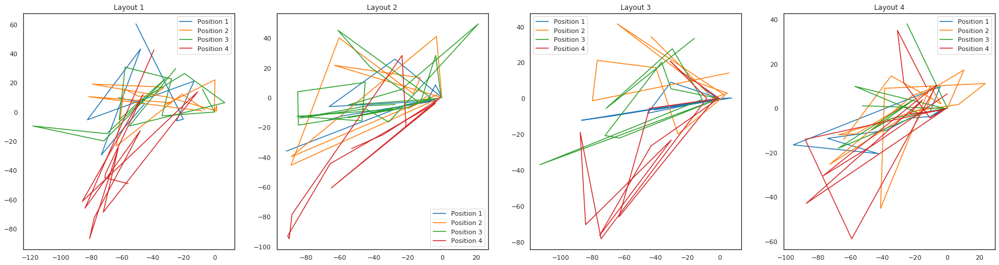

In [90]:
ring_data_x = kinematic_df[kinematic_df['name'] == 'ringProx_x'][['posData', 'position', 'layout']].squeeze() 
ring_data_y =  kinematic_df[kinematic_df['name'] == 'ringProx_y'][['posData', 'position', 'layout']].squeeze()
plot_types = [(idx1, idx2) for idx1 in range(1,5) for idx2 in range(1,5)]
fig, ax = plt.subplots(1,4, figsize=(30,7.5))
plot_data = [ring_data_x, ring_data_y]
for plot_type in plot_types:
    mask = pd.array(np.logical_and(ring_data_y['layout']==plot_type[0], ring_data_y['position']==plot_type[1]))
    ring_data_x_filtered = ring_data_x[mask]['posData'].str[0]
    ring_data_y_filtered = ring_data_y[mask]['posData'].str[0]
    
    ax[plot_type[0]-1].plot(ring_data_x_filtered, ring_data_y_filtered, label = 'Position ' + str(plot_type[1]))
    ax[plot_type[0]-1].set_title('Layout ' + str(plot_type[0]))
    ax[plot_type[0]-1].ylabel = 'Y position'
    ax[plot_type[0]-1].xlabel = 'X position'
    ax[plot_type[0]-1].legend()
    
fig.savefig('../figures/kinematic_trajectories.svg')
    

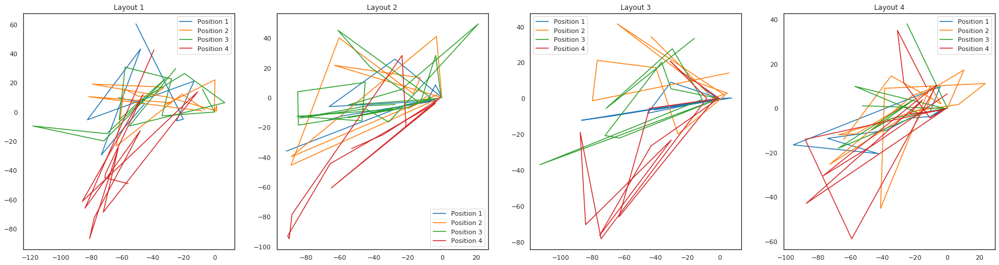

In [64]:
ring_data_x = smoothed_kinematic_df[smoothed_kinematic_df['name'] == 'ringProx_x'][['posData', 'position', 'layout']].squeeze() 
ring_data_y =  smoothed_kinematic_df[smoothed_kinematic_df['name'] == 'ringProx_y'][['posData', 'position', 'layout']].squeeze()
plot_types = [(idx1, idx2) for idx1 in range(1,5) for idx2 in range(1,5)]
fig, ax = plt.subplots(1,4, figsize=(30,7.5))
plot_data = [ring_data_x, ring_data_y]
for plot_type in plot_types:
    mask = pd.array(np.logical_and(ring_data_y['layout']==plot_type[0], ring_data_y['position']==plot_type[1]))
    ring_data_x_filtered = ring_data_x[mask]['posData'].str[0]
    ring_data_y_filtered = ring_data_y[mask]['posData'].str[0]
    
    ax[plot_type[0]-1].plot(ring_data_x_filtered, ring_data_y_filtered, label = 'Position ' + str(plot_type[1]))
    ax[plot_type[0]-1].set_title('Layout ' + str(plot_type[0]))
    ax[plot_type[0]-1].ylabel = 'Y position'
    ax[plot_type[0]-1].xlabel = 'X position'
    ax[plot_type[0]-1].legend()
    
fig.savefig('../figures/kinematic_trajectories.svg')
    

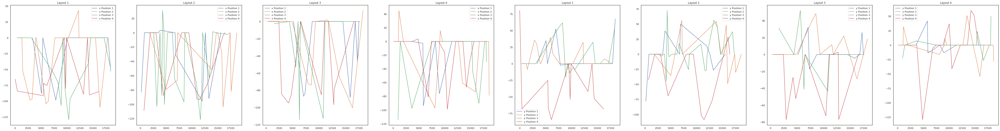

In [23]:
ring_data_x = kinematic_df[kinematic_df['name'] == 'ringProx_x'][['posData', 'position', 'layout']].squeeze() 
ring_data_y =  kinematic_df[kinematic_df['name'] == 'ringProx_y'][['posData', 'position', 'layout']].squeeze()
plot_types = [(idx1, idx2) for idx1 in range(1,5) for idx2 in range(1,5)]
fig, ax = plt.subplots(1,8, figsize=(80,10))
plot_data = [ring_data_x, ring_data_y]
for plot_type in plot_types:
    mask = pd.array(np.logical_and(ring_data_y['layout']==plot_type[0], ring_data_y['position']==plot_type[1]))
    ring_data_x_filtered = ring_data_x[mask]['posData'].str[0]
    ring_data_y_filtered = ring_data_y[mask]['posData'].str[0]
    
    ax[plot_type[0]-1].plot(ring_data_x_filtered, label = 'x Position ' + str(plot_type[1]))
    ax[plot_type[0]-1].set_title('Layout ' + str(plot_type[0]))
    ax[plot_type[0]-1].legend()
    
    ax[plot_type[0]+3].plot(ring_data_y_filtered, label = 'y Position ' + str(plot_type[1]))
    ax[plot_type[0]+3].set_title('Layout ' + str(plot_type[0]))
    ax[plot_type[0]+3].legend()

In [ ]:
ring_data_x = kinematic_df[kinematic_df['name'] == 'ringProx_x'][['posData', 'position', 'layout']].squeeze() 
ring_data_y =  kinematic_df[kinematic_df['name'] == 'ringProx_y'][['posData', 'position', 'layout']].squeeze()
plt.plot

## Analyze Data

In [64]:
import sys
sys.path.append('/gpfs/home/loconno3/utra2023/code')
import mocap_functions_copy

In [65]:
kinematic_df, neural_df, video_df, metadata = mocap_functions_copy.load_mocap_df('../data/SPK20220308/task_data/')

sampling_rate = 100
kernel_offset = int(metadata['kernel_halfwidth'] * sampling_rate)  #Convolution kernel centered at zero, add to neural offset
neural_offset = 20
offset = neural_offset + kernel_offset
window_size = 20
data_step_size = 1 

num_trials = metadata['num_trials']



#Generate cv_dict for regular train/test/validate split (no rolling window)
cv_split = ShuffleSplit(n_splits=5, test_size=.25, random_state=0)
val_split = ShuffleSplit(n_splits=1, test_size=.25, random_state=0)
cv_dict = {}
for fold, (train_val_idx, test_idx) in enumerate(cv_split.split(np.arange(num_trials))):
    for t_idx, v_idx in val_split.split(train_val_idx): #No looping, just used to split train/validation sets
        cv_dict[fold] = {'train_idx':train_val_idx[t_idx], 
                         'test_idx':test_idx, 
                         'validation_idx':train_val_idx[v_idx]} 

In [66]:
import torchvision
import numpy as np
import matplotlib.pyplot as plt
import torch
import itertools

In [67]:
from sklearn.preprocessing import StandardScaler
from mocap_functions_copy import SEE_Dataset

### Video Dataset Class

In [68]:
class Video_Dataset(torch.utils.data.Dataset):
    def __init__(self, cv_dict,  fold, partition, video_path, video_df, neural_df, subsample_scalar=1, load_from_pickle=True):
        self.video_path = video_path
        self.reader = torchvision.io.VideoReader(video_path, "video")
        self.md = self.reader.get_metadata()
        self.subsample_scalar = subsample_scalar
        self.video_df = video_df
        self.neural_df = neural_df
        self.cv_dict = cv_dict
        self.fold = fold
        self.partition = partition
        self.trial_idx = cv_dict[fold][partition]
        self.load_from_pickle = load_from_pickle
        self.video_datalist, self.neural_datalist, self.frame_datalist = self.process_dfs(video_df, neural_df)
        # Make this more robust
        self.aspect_ratio = (math.floor(((1056-100+2*0)/subsample_scalar)+1),math.floor(((1440-100+2*0)/subsample_scalar)+1))
        self.y_tensor, self.x_tensor = self.scale_data()
        self.time_stamps = torch.tensor(np.concatenate(self.video_datalist, axis=0))
        self.x_size = self[0][0].shape[1]
        self.y_size = self.y_tensor.shape[1]
        

        # super().__init__()
    
    '''
    Generates scaled y data
    '''
    def scale_data(self):
        scaler_y = StandardScaler()
        y_tensor = torch.tensor(scaler_y.fit_transform(np.concatenate(self.neural_datalist, axis=0)))
        scaler_x = StandardScaler()
        x = self.frame_datalist.numpy()
        x_tensor = torch.tensor(scaler_x.fit_transform(x.reshape(-1, x.shape[-1])).reshape(x.shape))
        return y_tensor, x_tensor
    
    '''
    Generates processed data
    '''
    def process_dfs(self, video_df, neural_df):
        videoData_list, neuralData_list = [], []
        for trial in self.trial_idx:
            # TODO: I'm throwing away the last trial because it spills over the end of the video by several seconds. Look for a more elegant fix!
            if trial != 217:
                videoData_array = np.stack(video_df['timeStamps'][video_df['trial'] == trial].values).transpose() 
                neuralData_array = np.stack(neural_df['rates'][neural_df['trial'] == trial].values).squeeze().transpose() 

                videoData_list.append(videoData_array)
                neuralData_list.append(neuralData_array) 
        
        if self.load_from_pickle:
            frame_data_list = self.load_frame_datalist(video_df)
        else:
            frame_data_list = self.save_frame_datalist(video_df)
        
        frame_data_list = frame_data_list.reshape([-1,1, frame_data_list.shape[2]])
        return videoData_list, neuralData_list, frame_data_list
    
    '''
    Helper function for pickling frame data
    '''
    def save_frame_datalist(self, video_df):
        frame_data_list = list()
        pooler = torch.nn.AvgPool2d(kernel_size=100, stride=self.subsample_scalar)
        # For each trial in the partition, save all frames as a pickle and add to returned data list
        for idx in self.trial_idx:
            if idx != 217:
                print(idx, end=' ')
                frame_times = video_df['timeStamps'][idx]
                frame_trial = list()
                for ftime in frame_times:
                    self.reader.seek(ftime - cam_start)
                    frame = next(self.reader)
                    frame_pooled = pooler(frame['data'].float())
                    frame_trial.append(frame_pooled[0, :, :].reshape(-1))

                frame_data_list.append(torch.stack(frame_trial))
                with open(f'../data/SPK20220308/frames/frame_trial{idx}', 'wb') as handle:
                    pickle.dump(torch.stack(frame_trial), handle, protocol=pickle.HIGHEST_PROTOCOL)
        return torch.stack(frame_data_list)
        
    '''
    Helper function for unpickling frame data
    '''
    def load_frame_datalist(self, video_df):
        frame_data_list = []
        # For each trial in the partition, load the frames from pickle and append to our returned data list
        for idx in self.trial_idx:
            # Still throwing away 217
            if idx != 217:
                print(idx, end=' ')
                with open(f'../data/SPK20220308/frames/frame_trial{idx}', 'rb') as handle:
                     frame_trial = pickle.load(handle)
                frame_data_list.append(frame_trial)
        return torch.stack(frame_data_list)
                
                
    '''
    Allows time indexing (s) into videos, returns relevant frames. Note that 
    indexes must be floats.

    Returns list(np.array)
    '''
    def __getitem__(self, key):
        return self.x_tensor[key], self.y_tensor[key,:]
            
            

    def __len__(self):
        return self.y_tensor.shape[0]

    """
    Given frames, print them
    """
    def print_frames(self, frames, step=1):
        num_frames = frames.shape[0]
        if num_frames > 1:
            fig, axes = plt.subplots(nrows=1, ncols= -(num_frames // -step), figsize=(24,24))
            i=0
            for n in range(0, num_frames, step):
                #curr_ax = axes[i//8, i%8] 
                curr_ax = axes[i]
                curr_ax.imshow(np.reshape(frames[n], self.aspect_ratio))
                i+=1
            return fig
        else:
            fig = plt.figure()
            plt.imshow(np.reshape(frames[0], self.aspect_ratio))
            plt.grid(None)
            return fig
            
    """
    Print the unblurred frames
    """
    def print_original_frames(self, frame_ids):
        frame_times = self.time_stamps[frame_ids]
        num_frames = frame_times.shape[0]
        frames = []
        if num_frames > 1:
            step=1
            fig, axes = plt.subplots(nrows=1, ncols= -(num_frames // -step), figsize=(24,24))
            i=0
            for time_stamp in frame_times:
                self.reader.seek(time_stamp - cam_start)
                frame = np.moveaxis(np.array(next(self.reader)['data']), 0, 2)
                curr_ax = axes[i] 
                curr_ax.imshow(frame)
                i+=1
            return
        else:
            fig = plt.figure()
            self.reader.seek(frame_times[0] - cam_start)
            frame = np.moveaxis(np.array(next(self.reader)['data']), 0, 2)
            plt.imshow(frame)
            plt.grid(None)
            return fig

In [69]:
class Baseline_Dataset(Video_Dataset):
    def __init__(self, cv_dict,  fold, partition, video_path, video_df, neural_df, subsample_scalar=1, load_from_pickle=False):
        super().__init__(cv_dict,  fold, partition, video_path, video_df, neural_df, subsample_scalar=subsample_scalar, load_from_pickle=load_from_pickle)
        self.y_tensor_real = self.y_tensor
        self.y_tensor = torch.broadcast_to(torch.mean(self.y_tensor,0), [self.y_tensor.shape[0], self.y_tensor.shape[1]])

In [70]:
class Video_Kinematic_Dataset(torch.utils.data.Dataset):
    def __init__(self, cv_dict,  fold, partition, video_path, kinematic_df, video_df, neural_df, offset, 
                 window_size, data_step_size, device, predict_kinematics, subsample_scalar=1, load_from_pickle=True):
        self.cv_dict = cv_dict
        self.partition = partition
        self.cv_dict[fold][partition]=np.delete(cv_dict[fold][partition], np.where(cv_dict[fold][partition]==217))
        self.video_dataset = Video_Dataset(cv_dict,  fold, partition, video_path, video_df, neural_df, subsample_scalar=1, load_from_pickle=True)
        self.kinematic_dataset = SEE_Dataset(cv_dict, fold, partition, kinematic_df, neural_df, offset, window_size, 
                                            data_step_size, device, 'posData', True, predict_kinematics)
        self.y_data, self.x_data = self.scale_data()
    #TODO CHECK THAT VIDEO AND KINEMATIC DATASETS ARE ALIGNED!
    # ALSO CHECK IF THIS NEEDS TO BE NORMALIZED!
    def __getitem__(self, key):
        return self.x_data[key], self.y_data[key]
    
    def __len__(self):
        return len(self.video_dataset)
    
    def scale_data(self):
        video_data = self.video_dataset[:][0][:,-1,:]
        neural_data = self.video_dataset[:][1]
        kinematic_data = self.kinematic_dataset[:][0]
        
        y_data, x = neural_data, np.concatenate((video_data, kinematic_data), axis=1)
    
        scaler_x = StandardScaler()
        x_data = torch.tensor(scaler_x.fit_transform(x.reshape(-1, x.shape[-1])).reshape(x.shape))
        
        return y_data, x_data                      

In [71]:
from mocap_functions_copy import SEE_Dataset
import importlib
importlib.reload(mocap_functions_copy)

<module 'mocap_functions_copy' from '/gpfs/home/loconno3/utra2023/code/mocap_functions_copy.py'>

# Analysis

In [72]:
import sys
sys.path.append('/gpfs/home/loconno3/utra2023/code')
import mocap_functions_copy
from sklearn.linear_model import LinearRegression
from sklearn.neural_network import MLPRegressor

In [73]:
def run_lr(X_train_data,y_train_data, X_test_data, y_test_data):
    reg = LinearRegression().fit(X_train_data, y_train_data)
    y_pred = reg.predict(X_test_data)
    print(reg.score(X_test_data, y_test_data))
    return y_pred, reg

In [74]:
def plot_predictions(y_pred, y_test):
    for n in range(y_test.shape[1]):
        plt.figure(figsize=(8,4))
        plt.title(f'Neuron {n}')
        plt.plot(y_pred[0:4000,n])
        plt.plot(y_test[0:4000,n])

In [75]:
def plot_corr(y_pred, y_test, plt_type=''):
    regression_test_corr = mocap_functions_copy.matrix_corr(y_pred, y_test, axis=0)
    plt.title(f'Distribution of Correlation Coefficients: {plt_type}')
    plt.ylabel('Number of Neurons')
    plt.xlabel('Correlation Coefficient')
    plt.hist(regression_test_corr)
    return regression_test_corr

In [76]:
def run_mlp(x_train, y_train, x_test, y_test):
    reg = MLPRegressor(hidden_layer_sizes=(400, 200, 100), learning_rate_init=0.0001, max_iter=1000, activation='tanh', alpha=0.001, batch_size=1000).fit(x_train, y_train)

    y_pred = reg.predict(x_test)
    print(reg.score(x_test, y_test))
    return y_pred, reg

## Initialize Data

In [77]:
# Set to True to train on average values
is_baseline = False
batch_size = 1000
subsample_scalar = 40

In [78]:
video_path = "/gpfs/home/loconno3/utra2023/data/SpikeCam3_03-08-1557.mp4"
train_params = {'batch_size': batch_size, 'shuffle': True, 'num_workers': num_cores, 'pin_memory':False}
train_eval_params = {'batch_size': batch_size, 'shuffle': False, 'num_workers': num_cores, 'pin_memory':False}
validation_params = {'batch_size': batch_size, 'shuffle': True, 'num_workers': num_cores, 'pin_memory':False}
test_params = {'batch_size': batch_size, 'shuffle': False, 'num_workers': num_cores, 'pin_memory':False}

if is_baseline:
    training_set = Baseline_Dataset(cv_dict,  fold, 'train_idx', video_path, video_df, neural_df, subsample_scalar=subsample_scalar)
    # X_train_data = training_set[:][0][:,-1,:].detach().cpu().numpy()
    # y_train_data = training_set[:][1][:,-1,:].detach().cpu().numpy()
    validation_set = Baseline_Dataset(cv_dict,  fold, 'validation_idx', video_path, video_df, neural_df, subsample_scalar=subsample_scalar)
    testing_set = Baseline_Dataset(cv_dict,  fold, 'test_idx', video_path, video_df, neural_df, subsample_scalar=subsample_scalar)

else:
    training_set = Video_Dataset(cv_dict,  fold, 'train_idx', video_path, video_df, neural_df, subsample_scalar=subsample_scalar, load_from_pickle=True)
    validation_set = Video_Dataset(cv_dict,  fold, 'validation_idx', video_path, video_df, neural_df, subsample_scalar=subsample_scalar, load_from_pickle=True)
    testing_set = Video_Dataset(cv_dict,  fold, 'test_idx', video_path, video_df, neural_df, subsample_scalar=subsample_scalar, load_from_pickle=True)
    
    # X_test_data = testing_set[:][0][:,-1,:].detach().cpu().numpy()
    # y_test_data = testing_set[:][1][:,-1,:].detach().cpu().numpy()

82 210 85 135 59 87 40 100 115 110 130 211 187 206 133 205 203 213 48 140 160 199 83 7 158 137 4 117 112 188 111 65 159 119 77 45 96 26 129 215 71 53 118 174 43 91 1 122 46 184 102 208 156 164 202 185 131 168 28 101 16 18 143 114 195 78 64 10 142 194 121 30 95 42 128 60 113 149 108 165 63 139 2 124 17 127 148 154 89 116 162 161 57 167 134 29 86 144 163 170 21 11 19 176 181 216 81 123 106 55 51 126 24 178 197 138 73 75 8 25 109 15 150 169 97 153 38 3 41 52 186 9 157 155 37 98 183 147 67 74 5 94 198 99 68 35 179 92 93 132 84 145 6 90 88 120 189 22 125 23 152 172 27 171 31 193 44 69 214 80 76 20 79 61 105 192 103 62 204 175 146 201 191 56 196 107 177 36 58 104 0 173 212 141 32 207 13 190 136 33 200 180 209 49 34 166 50 39 151 66 12 70 47 14 54 72 182 

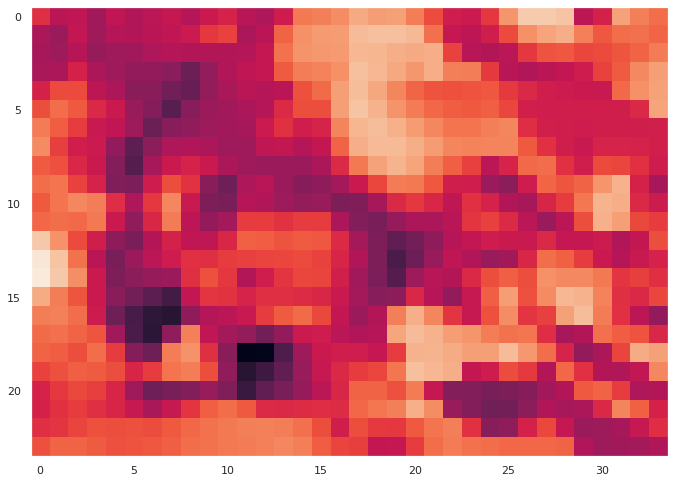

In [162]:
fig = training_set.print_frames(training_set[0][0])
fig.savefig('../figures/blurry_frame.svg')

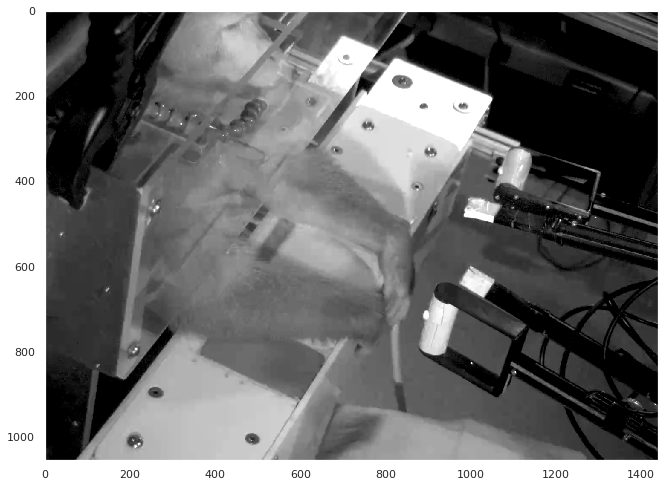

In [163]:
fig = training_set.print_original_frames(0)
fig.savefig('../figures/og_fig.svg')

## Regression

In [81]:
x_train, y_train = training_set[:]
x_test, y_test = testing_set[:]
x_train = torch.squeeze(x_train, 1)
x_test = torch.squeeze(x_test, 1)

x_train, y_train = x_train.numpy(), y_train.numpy()
x_test, y_test = x_test.numpy(), y_test.numpy()

In [40]:
y_pred, _ = run_lr(x_train, y_train, x_test, y_test)

-2.1501391556968894


/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opene

/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opene

/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opene

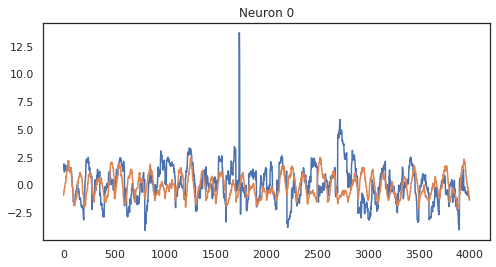

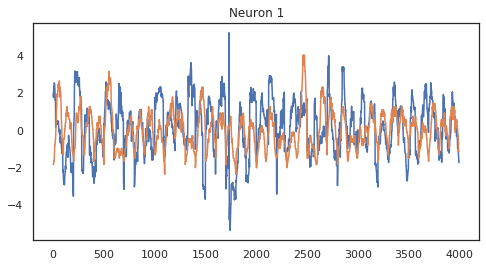

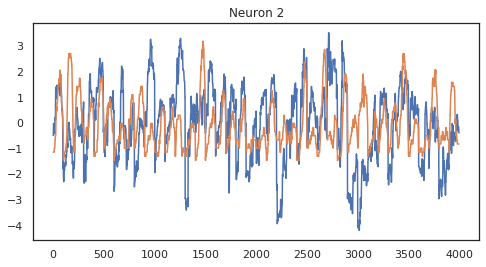

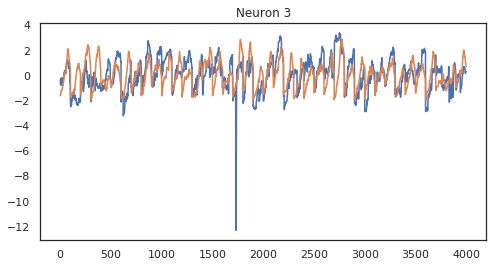

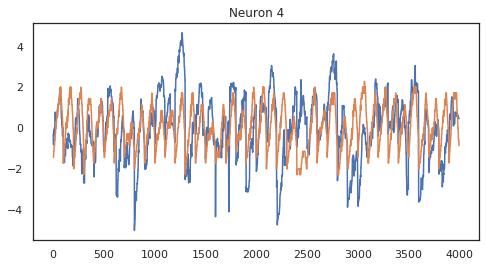

...

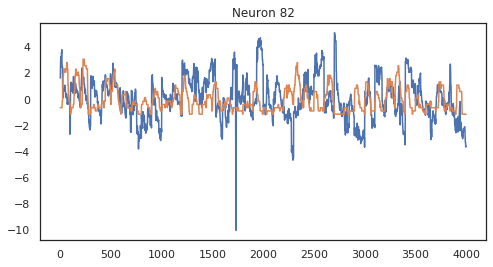

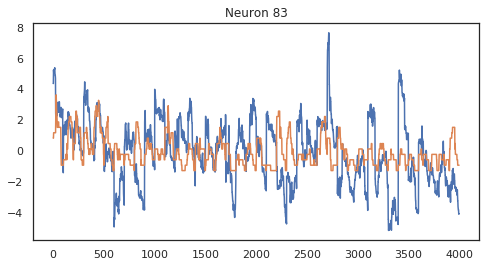

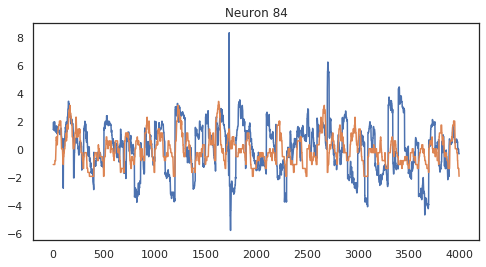

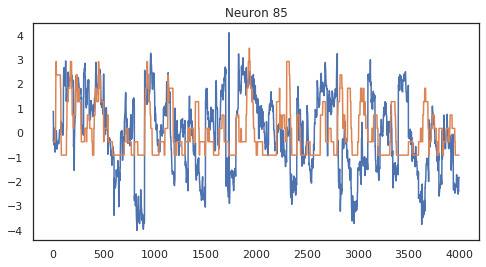

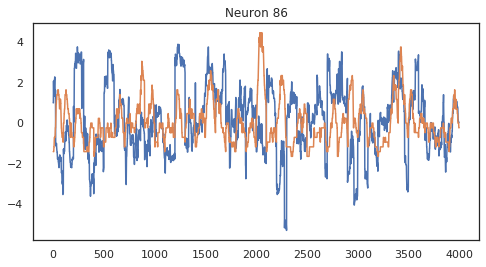

In [41]:
plot_predictions(y_pred, y_test)

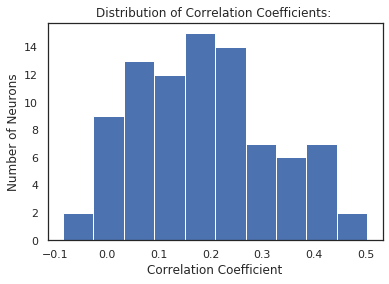

In [42]:
regression_test_corr = plot_corr(y_pred, y_test)

In [43]:
neuron_corrs = {}
neuron_corrs['video_lr'] = regression_test_corr

## Sklearn MLP

In [82]:
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error

In [83]:
y_pred, _ = run_mlp(x_train, y_train, x_test, y_test)

-0.3111396903883552


/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opene

/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opene

/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opene

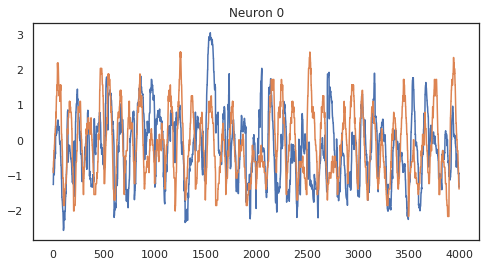

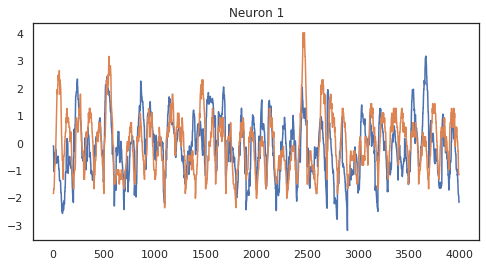

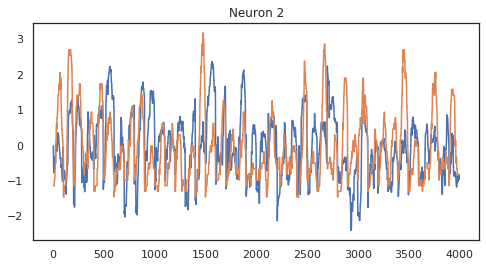

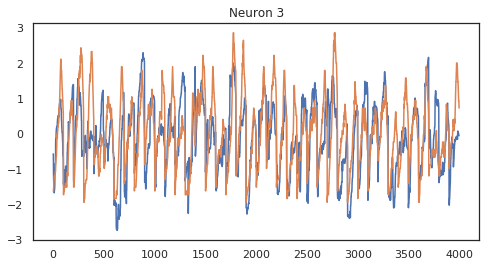

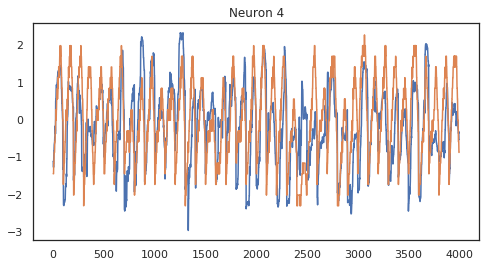

...

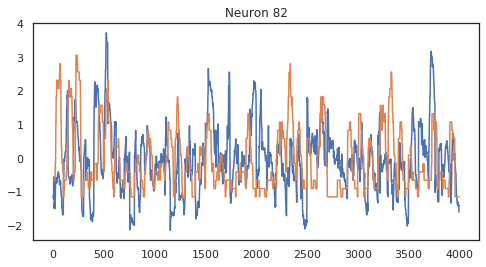

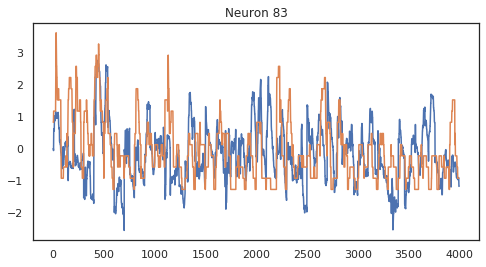

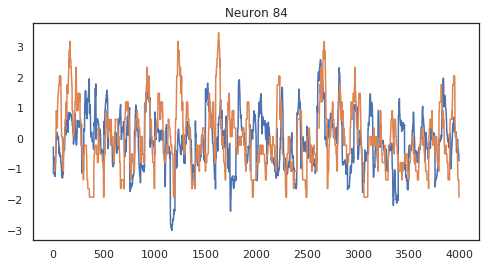

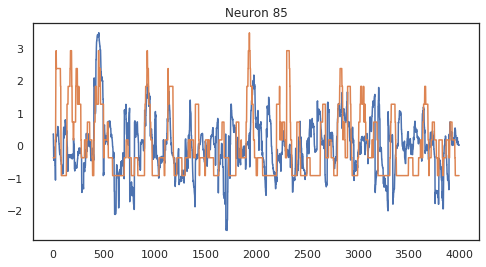

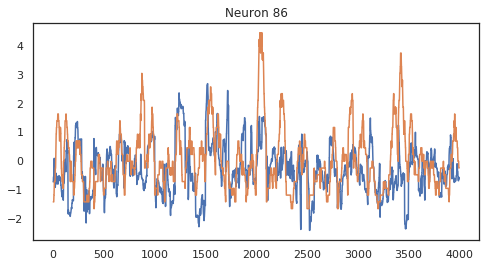

In [85]:
plot_predictions(y_pred, y_test)

In [ ]:
corrs = []
for fold in range(4):
    training_set = Video_Dataset(cv_dict,  fold, 'train_idx', video_path, video_df, neural_df, subsample_scalar=subsample_scalar, load_from_pickle=True)
    validation_set = Video_Dataset(cv_dict,  fold, 'validation_idx', video_path, video_df, neural_df, subsample_scalar=subsample_scalar, load_from_pickle=True)
    testing_set = Video_Dataset(cv_dict,  fold, 'test_idx', video_path, video_df, neural_df, subsample_scalar=subsample_scalar, load_from_pickle=True)
    
    x_train, y_train = training_set[:]
    x_val, y_val = validation_set[:]
    x_test, y_test = testing_set[:]
    x_train = torch.squeeze(x_train, 1)
    x_test = torch.squeeze(x_test, 1)

    x_train, y_train = x_train.numpy(), y_train.numpy()
    x_test, y_test = x_test.numpy(), y_test.numpy()
    
    reg, y_pred = run_mlp(x_train, y_train, x_val, y_val)
    corrs.append(plot_corr(y_pred, y_test))
    print(fold)

189 149 107 169 174 82 58 17 150 179 84 130 132 112 119 118 207 153 133 96 3 102 68 126 40 49 195 35 214 193 177 115 43 164 216 50 38 53 95 203 196 92 31 54 127 19 30 23 146 85 52 172 11 26 182 48 6 47 142 77 24 89 181 87 2 13 120 27 159 213 192 113 44 175 70 122 105 202 165 56 28 42 20 143 73 103 29 147 14 160 128 155 210 183 205 104 106 57 185 78 34 67 41 215 51 131 36 9 46 98 25 204 64 121 199 180 75 188 94 114 59 117 140 69 8 65 209 167 62 101 186 148 187 99 100 170 151 197 21 1 81 10 72 137 157 39 158 88 166 168 32 208 211 91 176 194 163 97 0 79 60 93 201 90 71 144 55 198 111 83 76 5 37 86 161 61 141 173 190 200 12 156 110 135 74 171 129 145 18 178 15 206 152 7 116 63 108 139 136 134 33 125 138 212 109 184 123 16 191 80 66 22 124 45 154 4 162 

###Notes 
7/11

PCA on firing rates: Weight for how much variance contributing?
Intertrial interval vs task - if FR different label as task related
Point plots MLP vs linear regression
 SSIMNETS- Color lines
GENERATE POINT PLOTS
Position or velocity, xyz
    Correlation
Look at activity during task vs rest
Try concatenating kinematic and video

Average Correlation: 0.3130614701306913
Mean Squared Error: 1.311139690388355


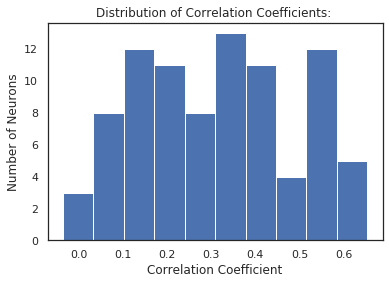

In [84]:
regression_test_corr = plot_corr(y_pred, y_test)
print(f'Average Correlation: {np.average(regression_test_corr)}')
print(f'Mean Squared Error: {mean_squared_error(y_test, y_pred)}')

In [87]:
neuron_corrs['video_mlp'] = regression_test_corr

### Grid Search hyperparameter tuning

In [122]:
from sklearn.model_selection import GridSearchCV

In [123]:
param_grid = {
    'hidden_layer_sizes':[50, 100, 500, 1000],
    'learning_rate_init':[0.1, 0.01, 0.001, 0.0001]
}
mlpr = MLPRegressor()
reg = GridSearchCV(mlpr, param_grid, verbose=10)
reg.fit(x_train, y_train)
sorted(reg.cv_results_.keys())

Fitting 5 folds for each of 16 candidates, totalling 80 fits
[CV 1/5; 1/16] START hidden_layer_sizes=50, learning_rate_init=0.1..............
[CV 1/5; 1/16] END hidden_layer_sizes=50, learning_rate_init=0.1;, score=-0.521 total time=  18.4s
[CV 2/5; 1/16] START hidden_layer_sizes=50, learning_rate_init=0.1..............
[CV 2/5; 1/16] END hidden_layer_sizes=50, learning_rate_init=0.1;, score=-0.832 total time=  17.5s
[CV 3/5; 1/16] START hidden_layer_sizes=50, learning_rate_init=0.1..............
[CV 3/5; 1/16] END hidden_layer_sizes=50, learning_rate_init=0.1;, score=-0.441 total time=  21.8s
[CV 4/5; 1/16] START hidden_layer_sizes=50, learning_rate_init=0.1..............
[CV 4/5; 1/16] END hidden_layer_sizes=50, learning_rate_init=0.1;, score=-0.515 total time=  18.8s
[CV 5/5; 1/16] START hidden_layer_sizes=50, learning_rate_init=0.1..............
[CV 5/5; 1/16] END hidden_layer_sizes=50, learning_rate_init=0.1;, score=-0.635 total time=  22.2s
[CV 1/5; 2/16] START hidden_layer_sizes

/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  ConvergenceWarning,


[CV 1/5; 3/16] END hidden_layer_sizes=50, learning_rate_init=0.001;, score=-0.337 total time=  48.2s
[CV 2/5; 3/16] START hidden_layer_sizes=50, learning_rate_init=0.001............


/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  ConvergenceWarning,


[CV 2/5; 3/16] END hidden_layer_sizes=50, learning_rate_init=0.001;, score=-0.614 total time=  48.6s
[CV 3/5; 3/16] START hidden_layer_sizes=50, learning_rate_init=0.001............


/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  ConvergenceWarning,


[CV 3/5; 3/16] END hidden_layer_sizes=50, learning_rate_init=0.001;, score=-0.500 total time=  48.5s
[CV 4/5; 3/16] START hidden_layer_sizes=50, learning_rate_init=0.001............


/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  ConvergenceWarning,


[CV 4/5; 3/16] END hidden_layer_sizes=50, learning_rate_init=0.001;, score=-0.576 total time=  48.2s
[CV 5/5; 3/16] START hidden_layer_sizes=50, learning_rate_init=0.001............


/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  ConvergenceWarning,


[CV 5/5; 3/16] END hidden_layer_sizes=50, learning_rate_init=0.001;, score=-0.421 total time=  49.1s
[CV 1/5; 4/16] START hidden_layer_sizes=50, learning_rate_init=0.0001...........


/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  ConvergenceWarning,


[CV 1/5; 4/16] END hidden_layer_sizes=50, learning_rate_init=0.0001;, score=-0.115 total time=  47.7s
[CV 2/5; 4/16] START hidden_layer_sizes=50, learning_rate_init=0.0001...........


/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  ConvergenceWarning,


[CV 2/5; 4/16] END hidden_layer_sizes=50, learning_rate_init=0.0001;, score=-0.231 total time=  48.7s
[CV 3/5; 4/16] START hidden_layer_sizes=50, learning_rate_init=0.0001...........


/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  ConvergenceWarning,


[CV 3/5; 4/16] END hidden_layer_sizes=50, learning_rate_init=0.0001;, score=-0.204 total time=  48.7s
[CV 4/5; 4/16] START hidden_layer_sizes=50, learning_rate_init=0.0001...........


/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  ConvergenceWarning,


[CV 4/5; 4/16] END hidden_layer_sizes=50, learning_rate_init=0.0001;, score=-0.240 total time=  49.7s
[CV 5/5; 4/16] START hidden_layer_sizes=50, learning_rate_init=0.0001...........


/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  ConvergenceWarning,


[CV 5/5; 4/16] END hidden_layer_sizes=50, learning_rate_init=0.0001;, score=-0.123 total time=  50.7s
[CV 1/5; 5/16] START hidden_layer_sizes=100, learning_rate_init=0.1.............
[CV 1/5; 5/16] END hidden_layer_sizes=100, learning_rate_init=0.1;, score=-0.609 total time=  41.9s
[CV 2/5; 5/16] START hidden_layer_sizes=100, learning_rate_init=0.1.............
[CV 2/5; 5/16] END hidden_layer_sizes=100, learning_rate_init=0.1;, score=-1.045 total time=  36.5s
[CV 3/5; 5/16] START hidden_layer_sizes=100, learning_rate_init=0.1.............
[CV 3/5; 5/16] END hidden_layer_sizes=100, learning_rate_init=0.1;, score=-0.685 total time=  37.9s
[CV 4/5; 5/16] START hidden_layer_sizes=100, learning_rate_init=0.1.............
[CV 4/5; 5/16] END hidden_layer_sizes=100, learning_rate_init=0.1;, score=-0.997 total time=  38.7s
[CV 5/5; 5/16] START hidden_layer_sizes=100, learning_rate_init=0.1.............
[CV 5/5; 5/16] END hidden_layer_sizes=100, learning_rate_init=0.1;, score=-0.896 total time= 

/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  ConvergenceWarning,


[CV 3/5; 7/16] END hidden_layer_sizes=100, learning_rate_init=0.001;, score=-0.613 total time= 1.3min
[CV 4/5; 7/16] START hidden_layer_sizes=100, learning_rate_init=0.001...........


/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  ConvergenceWarning,


[CV 4/5; 7/16] END hidden_layer_sizes=100, learning_rate_init=0.001;, score=-0.559 total time= 1.3min
[CV 5/5; 7/16] START hidden_layer_sizes=100, learning_rate_init=0.001...........


/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  ConvergenceWarning,


[CV 5/5; 7/16] END hidden_layer_sizes=100, learning_rate_init=0.001;, score=-0.568 total time= 1.3min
[CV 1/5; 8/16] START hidden_layer_sizes=100, learning_rate_init=0.0001..........


/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  ConvergenceWarning,


[CV 1/5; 8/16] END hidden_layer_sizes=100, learning_rate_init=0.0001;, score=-0.243 total time= 1.3min
[CV 2/5; 8/16] START hidden_layer_sizes=100, learning_rate_init=0.0001..........


/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  ConvergenceWarning,


[CV 2/5; 8/16] END hidden_layer_sizes=100, learning_rate_init=0.0001;, score=-0.359 total time= 1.3min
[CV 3/5; 8/16] START hidden_layer_sizes=100, learning_rate_init=0.0001..........


/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  ConvergenceWarning,


[CV 3/5; 8/16] END hidden_layer_sizes=100, learning_rate_init=0.0001;, score=-0.296 total time= 1.3min
[CV 4/5; 8/16] START hidden_layer_sizes=100, learning_rate_init=0.0001..........


/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  ConvergenceWarning,


[CV 4/5; 8/16] END hidden_layer_sizes=100, learning_rate_init=0.0001;, score=-0.406 total time= 1.3min
[CV 5/5; 8/16] START hidden_layer_sizes=100, learning_rate_init=0.0001..........


/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  ConvergenceWarning,


[CV 5/5; 8/16] END hidden_layer_sizes=100, learning_rate_init=0.0001;, score=-0.286 total time= 1.3min
[CV 1/5; 9/16] START hidden_layer_sizes=500, learning_rate_init=0.1.............
[CV 1/5; 9/16] END hidden_layer_sizes=500, learning_rate_init=0.1;, score=-0.842 total time= 4.9min
[CV 2/5; 9/16] START hidden_layer_sizes=500, learning_rate_init=0.1.............
[CV 2/5; 9/16] END hidden_layer_sizes=500, learning_rate_init=0.1;, score=-3.239 total time= 3.0min
[CV 3/5; 9/16] START hidden_layer_sizes=500, learning_rate_init=0.1.............
[CV 3/5; 9/16] END hidden_layer_sizes=500, learning_rate_init=0.1;, score=-4.761 total time= 1.4min
[CV 4/5; 9/16] START hidden_layer_sizes=500, learning_rate_init=0.1.............
[CV 4/5; 9/16] END hidden_layer_sizes=500, learning_rate_init=0.1;, score=-6.474 total time= 1.2min
[CV 5/5; 9/16] START hidden_layer_sizes=500, learning_rate_init=0.1.............
[CV 5/5; 9/16] END hidden_layer_sizes=500, learning_rate_init=0.1;, score=-5.566 total time=

/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  ConvergenceWarning,


[CV 1/5; 12/16] END hidden_layer_sizes=500, learning_rate_init=0.0001;, score=-0.319 total time= 5.7min
[CV 2/5; 12/16] START hidden_layer_sizes=500, learning_rate_init=0.0001.........


/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  ConvergenceWarning,


[CV 2/5; 12/16] END hidden_layer_sizes=500, learning_rate_init=0.0001;, score=-0.344 total time= 5.9min
[CV 3/5; 12/16] START hidden_layer_sizes=500, learning_rate_init=0.0001.........


/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  ConvergenceWarning,


[CV 3/5; 12/16] END hidden_layer_sizes=500, learning_rate_init=0.0001;, score=-0.420 total time= 5.6min
[CV 4/5; 12/16] START hidden_layer_sizes=500, learning_rate_init=0.0001.........


/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  ConvergenceWarning,


[CV 4/5; 12/16] END hidden_layer_sizes=500, learning_rate_init=0.0001;, score=-0.440 total time= 5.4min
[CV 5/5; 12/16] START hidden_layer_sizes=500, learning_rate_init=0.0001.........


/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  ConvergenceWarning,


[CV 5/5; 12/16] END hidden_layer_sizes=500, learning_rate_init=0.0001;, score=-0.307 total time= 5.3min
[CV 1/5; 13/16] START hidden_layer_sizes=1000, learning_rate_init=0.1...........
[CV 1/5; 13/16] END hidden_layer_sizes=1000, learning_rate_init=0.1;, score=-18.426 total time= 3.3min
[CV 2/5; 13/16] START hidden_layer_sizes=1000, learning_rate_init=0.1...........
[CV 2/5; 13/16] END hidden_layer_sizes=1000, learning_rate_init=0.1;, score=-22.581 total time= 2.6min
[CV 3/5; 13/16] START hidden_layer_sizes=1000, learning_rate_init=0.1...........
[CV 3/5; 13/16] END hidden_layer_sizes=1000, learning_rate_init=0.1;, score=-26.652 total time= 1.9min
[CV 4/5; 13/16] START hidden_layer_sizes=1000, learning_rate_init=0.1...........
[CV 4/5; 13/16] END hidden_layer_sizes=1000, learning_rate_init=0.1;, score=-29.248 total time= 1.6min
[CV 5/5; 13/16] START hidden_layer_sizes=1000, learning_rate_init=0.1...........
[CV 5/5; 13/16] END hidden_layer_sizes=1000, learning_rate_init=0.1;, score=-40

/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  ConvergenceWarning,


['mean_fit_time',
 'mean_score_time',
 'mean_test_score',
 'param_hidden_layer_sizes',
 'param_learning_rate_init',
 'params',
 'rank_test_score',
 'split0_test_score',
 'split1_test_score',
 'split2_test_score',
 'split3_test_score',
 'split4_test_score',
 'std_fit_time',
 'std_score_time',
 'std_test_score']

In [128]:
best_reg = reg.best_estimator_
y_pred = best_reg.predict(x_test)
best_reg.score(x_train, y_train)
best_reg.learning_rate_init
lr=0.0001
best_reg.hidden_layer_sizes

50

## ANN Model

### Hyperparameters and Model Initialization

In [190]:
#Define hyperparameters
lr = 0.0001
weight_decay = 1e-5
layer_size=[400, 200, 100]
max_epochs=1000
input_size = training_set.x_size
output_size = training_set.y_size

model_ann = mocap_functions_copy.model_ann(input_size,output_size,layer_size, batch_size=batch_size).to(device)
# Define Loss, Optimizerints h
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model_ann.parameters(), lr=lr, weight_decay=weight_decay)

### Train

In [191]:
#Train model
loss_dict = mocap_functions_copy.train_validate_model(model_ann, optimizer, criterion, max_epochs, training_set, validation_set, device)

Begun training, validating
Epoch: 0


  0%|          | 0/13 [00:00<?, ?it/s]/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/torch/nn/functional.py:1956: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
 77%|███████▋  | 10/13 [00:00<00:00, 44.99it/s]

Evaluating



  0%|          | 0/4 [00:00<?, ?it/s]

*Epoch: 1




100%|██████████| 13/13 [00:00<00:00, 40.46it/s]


 38%|███▊      | 5/13 [00:00<00:00, 44.51it/s]

 77%|███████▋  | 10/13 [00:00<00:00, 44.52it/s]

Evaluating


100%|██████████| 4/4 [00:00<00:00, 12.30it/s]


*Epoch: 2



100%|██████████| 13/13 [00:00<00:00, 39.55it/s]

 77%|███████▋  | 10/13 [00:00<00:00, 45.07it/s]

Evaluating




100%|██████████| 4/4 [00:00<00:00, 12.27it/s]


*Epoch: 3


 77%|███████▋  | 10/13 [00:00<00:00, 43.76it/s]

Evaluating



100%|██████████| 4/4 [00:00<00:00, 12.22it/s]


*Epoch: 4




100%|██████████| 13/13 [00:00<00:00, 39.29it/s]


 38%|███▊      | 5/13 [00:00<00:00, 45.41it/s]

 77%|███████▋  | 10/13 [00:00<00:00, 44.98it/s]

Evaluating


100%|██████████| 4/4 [00:00<00:00, 12.36it/s]


*Epoch: 5



100%|██████████| 13/13 [00:00<00:00, 39.93it/s]

 77%|███████▋  | 10/13 [00:00<00:00, 44.20it/s]

Evaluating




100%|██████████| 4/4 [00:00<00:00, 12.04it/s]


*Epoch: 6


 77%|███████▋  | 10/13 [00:00<00:00, 45.83it/s]

Evaluating



100%|██████████| 4/4 [00:00<00:00, 12.64it/s]


*Epoch: 7




100%|██████████| 13/13 [00:00<00:00, 40.71it/s]


 38%|███▊      | 5/13 [00:00<00:00, 44.66it/s]

 77%|███████▋  | 10/13 [00:00<00:00, 44.63it/s]

Evaluating


100%|██████████| 4/4 [00:00<00:00, 12.18it/s]


*Epoch: 8



100%|██████████| 13/13 [00:00<00:00, 39.58it/s]

 77%|███████▋  | 10/13 [00:00<00:00, 45.04it/s]

Evaluating




100%|██████████| 4/4 [00:00<00:00, 12.28it/s]


*Epoch: 9


 77%|███████▋  | 10/13 [00:00<00:00, 45.57it/s]

Evaluating



100%|██████████| 4/4 [00:00<00:00, 12.56it/s]


*
Epoch: 10/1000 ... Train Loss: 0.7903  ... Validation Loss: 0.8302
Epoch: 10




100%|██████████| 13/13 [00:00<00:00, 40.25it/s]


 38%|███▊      | 5/13 [00:00<00:00, 45.32it/s]

 77%|███████▋  | 10/13 [00:00<00:00, 44.94it/s]

Evaluating


100%|██████████| 4/4 [00:00<00:00, 12.31it/s]


*Epoch: 11



100%|██████████| 13/13 [00:00<00:00, 39.87it/s]

 77%|███████▋  | 10/13 [00:00<00:00, 44.28it/s]

Evaluating




100%|██████████| 4/4 [00:00<00:00, 12.06it/s]


*Epoch: 12


 77%|███████▋  | 10/13 [00:00<00:00, 45.74it/s]

Evaluating



100%|██████████| 4/4 [00:00<00:00, 12.62it/s]


*Epoch: 13




100%|██████████| 13/13 [00:00<00:00, 40.68it/s]


 38%|███▊      | 5/13 [00:00<00:00, 44.52it/s]

 77%|███████▋  | 10/13 [00:00<00:00, 44.54it/s]

Evaluating


100%|██████████| 4/4 [00:00<00:00, 12.19it/s]


*Epoch: 14



100%|██████████| 13/13 [00:00<00:00, 39.55it/s]

 77%|███████▋  | 10/13 [00:00<00:00, 44.97it/s]

Evaluating




100%|██████████| 4/4 [00:00<00:00, 12.27it/s]


*Epoch: 15


 77%|███████▋  | 10/13 [00:00<00:00, 45.43it/s]

Evaluating



100%|██████████| 4/4 [00:00<00:00, 12.53it/s]


*Epoch: 16




100%|██████████| 13/13 [00:00<00:00, 40.18it/s]


 38%|███▊      | 5/13 [00:00<00:00, 45.33it/s]

 77%|███████▋  | 10/13 [00:00<00:00, 44.94it/s]

Evaluating


100%|██████████| 4/4 [00:00<00:00, 12.31it/s]


*Epoch: 17



100%|██████████| 13/13 [00:00<00:00, 39.94it/s]

 77%|███████▋  | 10/13 [00:00<00:00, 44.50it/s]

Evaluating




100%|██████████| 4/4 [00:00<00:00, 12.12it/s]


*Epoch: 18


 77%|███████▋  | 10/13 [00:00<00:00, 45.93it/s]

Evaluating



100%|██████████| 4/4 [00:00<00:00, 12.68it/s]


*Epoch: 19




100%|██████████| 13/13 [00:00<00:00, 40.87it/s]


 38%|███▊      | 5/13 [00:00<00:00, 44.70it/s]

 77%|███████▋  | 10/13 [00:00<00:00, 44.69it/s]

Evaluating


100%|██████████| 4/4 [00:00<00:00, 12.25it/s]


*
Epoch: 20/1000 ... Train Loss: 0.7073  ... Validation Loss: 0.7949
Epoch: 20



100%|██████████| 13/13 [00:00<00:00, 39.74it/s]

 77%|███████▋  | 10/13 [00:00<00:00, 45.19it/s]

Evaluating




100%|██████████| 4/4 [00:00<00:00, 12.31it/s]


*Epoch: 21


 77%|███████▋  | 10/13 [00:00<00:00, 45.88it/s]

Evaluating



100%|██████████| 4/4 [00:00<00:00, 12.67it/s]


.Epoch: 22




100%|██████████| 13/13 [00:00<00:00, 40.65it/s]


 38%|███▊      | 5/13 [00:00<00:00, 45.21it/s]

 77%|███████▋  | 10/13 [00:00<00:00, 45.00it/s]

Evaluating


100%|██████████| 4/4 [00:00<00:00, 12.35it/s]


.Epoch: 23



100%|██████████| 13/13 [00:00<00:00, 40.15it/s]

 77%|███████▋  | 10/13 [00:00<00:00, 44.85it/s]

Evaluating




100%|██████████| 4/4 [00:00<00:00, 12.13it/s]


.Epoch: 24


 77%|███████▋  | 10/13 [00:00<00:00, 45.78it/s]

Evaluating



100%|██████████| 4/4 [00:00<00:00, 12.63it/s]


.Epoch: 25




100%|██████████| 13/13 [00:00<00:00, 40.68it/s]


 38%|███▊      | 5/13 [00:00<00:00, 44.73it/s]

 77%|███████▋  | 10/13 [00:00<00:00, 44.65it/s]

Evaluating


100%|██████████| 4/4 [00:00<00:00, 12.28it/s]


.Epoch: 26



100%|██████████| 13/13 [00:00<00:00, 39.64it/s]

 77%|███████▋  | 10/13 [00:00<00:00, 44.89it/s]

Evaluating




100%|██████████| 4/4 [00:00<00:00, 12.15it/s]


.Epoch: 27


 77%|███████▋  | 10/13 [00:00<00:00, 45.56it/s]

Evaluating



100%|██████████| 4/4 [00:00<00:00, 12.60it/s]


.Epoch: 28




100%|██████████| 13/13 [00:00<00:00, 40.41it/s]


 38%|███▊      | 5/13 [00:00<00:00, 44.95it/s]

 77%|███████▋  | 10/13 [00:00<00:00, 44.75it/s]

Evaluating


100%|██████████| 4/4 [00:00<00:00, 12.28it/s]


.Epoch: 29



100%|██████████| 13/13 [00:00<00:00, 40.07it/s]

 77%|███████▋  | 10/13 [00:00<00:00, 44.56it/s]

Evaluating




100%|██████████| 4/4 [00:00<00:00, 12.09it/s]


.
Epoch: 30/1000 ... Train Loss: 0.6582  ... Validation Loss: 0.7981
Epoch: 30


 77%|███████▋  | 10/13 [00:00<00:00, 45.79it/s]

Evaluating



100%|██████████| 4/4 [00:00<00:00, 12.61it/s]


.Epoch: 31




100%|██████████| 13/13 [00:00<00:00, 40.65it/s]


 38%|███▊      | 5/13 [00:00<00:00, 44.58it/s]

 77%|███████▋  | 10/13 [00:00<00:00, 44.10it/s]

Evaluating


100%|██████████| 4/4 [00:00<00:00, 12.19it/s]


.Epoch: 32



100%|██████████| 13/13 [00:00<00:00, 39.40it/s]

 77%|███████▋  | 10/13 [00:00<00:00, 44.82it/s]

Evaluating




100%|██████████| 4/4 [00:00<00:00, 12.16it/s]


.Epoch: 33


 77%|███████▋  | 10/13 [00:00<00:00, 45.53it/s]

Evaluating



100%|██████████| 4/4 [00:00<00:00, 12.59it/s]


.Epoch: 34




100%|██████████| 13/13 [00:00<00:00, 40.52it/s]


 38%|███▊      | 5/13 [00:00<00:00, 44.79it/s]

 77%|███████▋  | 10/13 [00:00<00:00, 44.74it/s]

Evaluating


100%|██████████| 4/4 [00:00<00:00, 12.31it/s]


.Epoch: 35



100%|██████████| 13/13 [00:00<00:00, 40.01it/s]

 77%|███████▋  | 10/13 [00:00<00:00, 44.62it/s]

Evaluating




100%|██████████| 4/4 [00:00<00:00, 12.10it/s]


.Epoch: 36


 77%|███████▋  | 10/13 [00:00<00:00, 45.84it/s]

Evaluating



100%|██████████| 4/4 [00:00<00:00, 12.63it/s]


.Epoch: 37




100%|██████████| 13/13 [00:00<00:00, 40.70it/s]


 38%|███▊      | 5/13 [00:00<00:00, 44.85it/s]

 77%|███████▋  | 10/13 [00:00<00:00, 44.68it/s]

Evaluating


100%|██████████| 4/4 [00:00<00:00, 12.30it/s]


.Epoch: 38



100%|██████████| 13/13 [00:00<00:00, 39.76it/s]

 77%|███████▋  | 10/13 [00:00<00:00, 44.75it/s]

Evaluating




100%|██████████| 4/4 [00:00<00:00, 12.17it/s]


.Epoch: 39


 77%|███████▋  | 10/13 [00:00<00:00, 45.63it/s]

Evaluating



100%|██████████| 4/4 [00:00<00:00, 12.61it/s]


.
Epoch: 40/1000 ... Train Loss: 0.6197  ... Validation Loss: 0.7997
Epoch: 40




100%|██████████| 13/13 [00:00<00:00, 40.57it/s]


 38%|███▊      | 5/13 [00:00<00:00, 44.58it/s]

 77%|███████▋  | 10/13 [00:00<00:00, 44.67it/s]

Evaluating


100%|██████████| 4/4 [00:00<00:00, 12.30it/s]


.Epoch: 41



100%|██████████| 13/13 [00:00<00:00, 39.98it/s]

 77%|███████▋  | 10/13 [00:00<00:00, 44.61it/s]

Evaluating




100%|██████████| 4/4 [00:00<00:00, 105.65it/s]

. Early Stop; Min Epoch: 21


In [177]:
loss_dict
print("Minimum validation loss: " + str(loss_dict['min_validation_loss']))
print("Minimum validation STD: " + str(loss_dict['min_validation_std']))
print("Epoch of minimum validation loss: " + str(loss_dict['min_validation_epoch']))
print("Minimum training loss: " + str(loss_dict['min_train_loss']))
print("Minimum training STD: " + str(loss_dict['min_train_std']))

Minimum validation loss: 0.7984875291585922
Minimum validation STD: 0.11453287506626525
Epoch of minimum validation loss: 20
Minimum training loss: 0.706296620460657
Minimum training STD: 0.1834811356104813


Text(0, 0.5, 'MSE Loss')

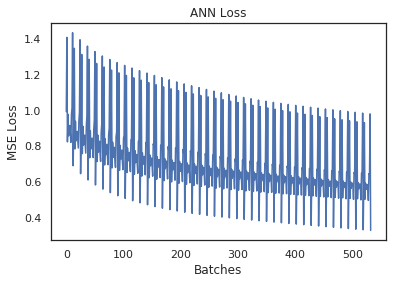

In [178]:
loss_data = np.concatenate(loss_dict['train_loss_array'])
batches = list(range(len(loss_data)))

plt.title('ANN Loss')
plt.plot(batches, loss_data)
plt.xlabel('Batches')
plt.ylabel('MSE Loss')

### Evaluate

In [180]:
from tqdm.auto import tqdm

In [181]:
#Helper function to evaluate decoding performance on a trained model
def evaluate_model_n(model, dataset, device):
    #Run model through test set
    with torch.no_grad():
        model.eval()
        #Generate train set predictions
        y_pred_tensor = torch.zeros(len(dataset), dataset.y_tensor.shape[1])
        batch_idx = 0
        progress_bar = tqdm(range(0, len(dataset), batch_size))
        #for b in range(0, len(dataset), batch_size):
        for b in range(0, batch_size, batch_size):
            batch_x, batch_y = dataset[b:b+batch_size]
#             batch_x, _ = dataset[b:b+batch_size]
#             batch_y = new_training_set.y_tensor_real[b:b+batch_size]
            batch_x = batch_x.float().to(device)
            batch_y = batch_y.float().to(device)
            output = model(batch_x)
            y_pred_tensor[batch_idx:(batch_idx+output.size(0)),:] = output[:,-1,:]
            batch_idx += output.size(0)
            progress_bar.update(1)

    y_pred = y_pred_tensor.detach().cpu().numpy()
    return y_pred

In [182]:
#Evaluate trained model
ann_train_pred = evaluate_model_n(model_ann, training_set, device)

ann_test_pred = evaluate_model_n(model_ann, testing_set, device)

#Compute decoding performance
y_train_data = training_set.y_tensor
y_test_data = testing_set.y_tensor
# ann_train_corr = mocap_functions_copy.matrix_corr(ann_train_pred,y_train_data)
# ann_test_corr = mocap_functions_copy.matrix_corr(ann_test_pred,y_test_data)

  0%|          | 0/13 [00:00<?, ?it/s]/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/torch/nn/functional.py:1956: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")
 17%|█▋        | 1/6 [00:00<00:00, 113.41it/s]


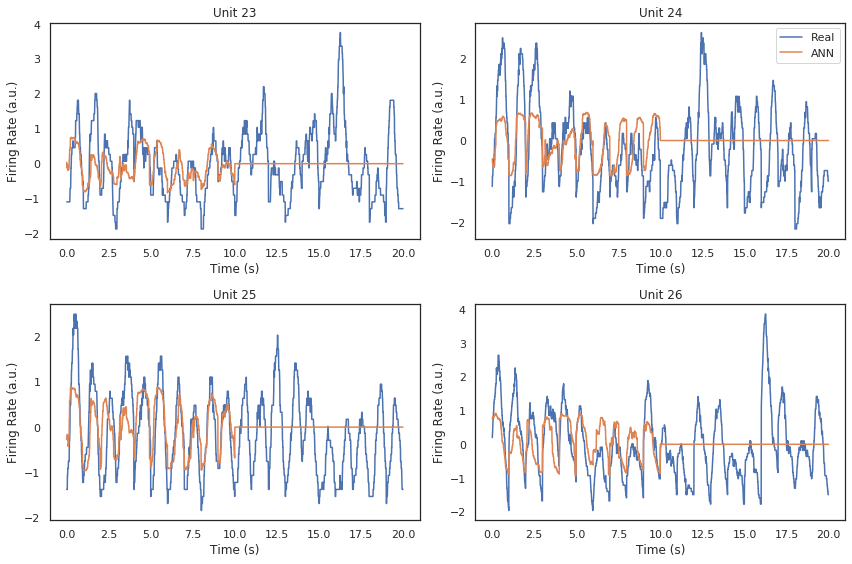

In [183]:
#Testing Data
y_train_data = training_set.y_tensor
y_test_data = testing_set.y_tensor
start=23
plt.figure(figsize=(12,8))
bounds = np.arange(1,2000)
x_vals = np.arange(len(bounds)) / 100
for plot_idx, unit_idx in enumerate(range(start, start+4)):
    plt.subplot(2,2,plot_idx+1)
    plt.plot(x_vals,y_test_data[bounds,unit_idx])
    # plt.plot(x_vals,kf_test_pred[bounds,unit_idx])
    plt.plot(x_vals,ann_test_pred[bounds,unit_idx])
    plt.title('Unit ' + str(unit_idx))
    plt.xlabel('Time (s)')
    plt.ylabel('Firing Rate (a.u.)')
    if plot_idx==1:
        plt.legend(['Real', 'ANN'], loc=1)
plt.tight_layout()

(array([ 1.,  6.,  7.,  4., 14., 16., 15., 14.,  9.,  1.]),
 array([0.03697792, 0.0630163 , 0.08905467, 0.11509304, 0.14113142,
        0.16716979, 0.19320816, 0.21924654, 0.24528491, 0.27132328,
        0.29736166]),
 <a list of 10 Patch objects>)

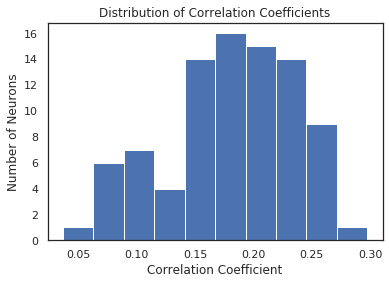

In [185]:
ann_train_corr = mocap_functions_copy.matrix_corr(ann_train_pred,y_train_data.numpy())
plt.title('Distribution of Correlation Coefficients')
plt.ylabel('Number of Neurons')
plt.xlabel('Correlation Coefficient')
plt.hist(ann_train_corr)

In [186]:
print(np.mean(ann_train_corr))

0.18165587558623758


## CNN

In [81]:
x_train, y_train = training_set[:]
y_train = y_train.type('torch.FloatTensor')
print(x_train.shape)
x_train = x_train.reshape([-1,100,816])
x_test, y_test = testing_set[:]
x_train = torch.squeeze(x_train, 1)
x_test = torch.squeeze(x_test, 1)
x_test = x_test.reshape([-1,100,816])
y_test = y_test.type('torch.FloatTensor')


torch.Size([12100, 902])


RuntimeError: shape '[-1, 100, 816]' is invalid for input of size 10914200

In [300]:
#Define hyperparameters
lr = 0.0001
weight_decay = 1e-5
layer_size=[400, 200, 100]
max_epochs=1000
input_size = training_set.x_size
output_size = training_set.y_size
batch_size = 10

 
# Define Loss, Optimizerints h
loss_fn = nn.MSELoss()
optimizer = torch.optim.Adam(model_ann.parameters(), lr=lr, weight_decay=weight_decay)

In [301]:
model = nn.Sequential(
    nn.Conv1d(100, 10, 2),
    nn.ReLU(),
    nn.Linear(815, layer_size[1]),
    nn.ReLU(),
    nn.Linear(layer_size[1], output_size),
)

In [302]:
# Hold the best model
best_mse = np.inf   # init to infinity
best_weights = None
history = []
 
for epoch in range(max_epochs):
    model.train()
    for epoch in range(max_epochs):
        # take a batch
        X_batch = x_train[start:start+batch_size,:,:]
        y_batch = y_train[start:start+batch_size,:]
        # forward pass
        y_pred = model(X_batch)
        loss = loss_fn(y_pred, y_batch)
        # backward pass
        optimizer.zero_grad()
        loss.backward()
        # update weights
        optimizer.step()
    # evaluate accuracy at end of each epoch
    model.eval()
    y_pred = model(x_test)
    mse = loss_fn(y_pred, y_test)
    mse = float(mse)
    history.append(mse)
    if mse < best_mse:
        best_mse = mse
        best_weights = copy.deepcopy(model.state_dict())
 
# restore model and return best accuracy
model.load_state_dict(best_weights)
print("MSE: %.2f" % best_mse)
print("RMSE: %.2f" % np.sqrt(best_mse))
plt.plot(history)
plt.show()

/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([5500, 87])) that is different to the input size (torch.Size([55, 10, 87])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


RuntimeError: The size of tensor a (10) must match the size of tensor b (5500) at non-singleton dimension 1

# Kinematic Analysis

## Regression

In [107]:
# Set up PyTorch Dataloaders
fold=0
kinematic_type = 'posData'
# Parameters
batch_size = 10000
train_params = {'batch_size': batch_size, 'shuffle': True, 'num_workers': num_cores, 'pin_memory':False}
train_eval_params = {'batch_size': batch_size, 'shuffle': False, 'num_workers': num_cores, 'pin_memory':False}
validation_params = {'batch_size': batch_size, 'shuffle': True, 'num_workers': num_cores, 'pin_memory':False}
test_params = {'batch_size': batch_size, 'shuffle': False, 'num_workers': num_cores, 'pin_memory':False}

predict_kinematics=False
# Generators
training_set = mocap_functions.SEE_Dataset(cv_dict, fold, 'train_idx', kinematic_df, neural_df, offset, window_size, 
                                            data_step_size, device, 'posData', True, predict_kinematics)
training_generator = torch.utils.data.DataLoader(training_set, **train_params)
training_eval_generator = torch.utils.data.DataLoader(training_set, **train_eval_params)
X_train_data = training_set[:][0][:,-1,:].detach().cpu().numpy()
y_train_data = training_set[:][1][:,-1,:].detach().cpu().numpy()

validation_set = mocap_functions.SEE_Dataset(cv_dict, fold, 'validation_idx', kinematic_df, neural_df, offset, window_size, 
                                                data_step_size, device, 'posData', True, predict_kinematics)
validation_generator = torch.utils.data.DataLoader(validation_set, **validation_params)

testing_set = mocap_functions.SEE_Dataset(cv_dict, fold, 'test_idx', kinematic_df, neural_df, offset, window_size, 
                                                data_step_size, device, 'posData', True, predict_kinematics)
testing_generator = torch.utils.data.DataLoader(testing_set, **test_params)
X_test_data = testing_set[:][0][:,-1,:].detach().cpu().numpy()
y_test_data = testing_set[:][1][:,-1,:].detach().cpu().numpy()

/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 32 worker processes in total. Our suggested max number of worker in current system is 1, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 32 worker processes in total. Our suggested max number of worker in current system is 1, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
/users/loconno3/anaconda/SEE/lib/python3.7/site-pa

In [108]:
reg = LinearRegression().fit(X_train_data, y_train_data)
y_pred = reg.predict(X_test_data)
reg.score(X_test_data, y_test_data)

0.036713440361057274

/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control

/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control

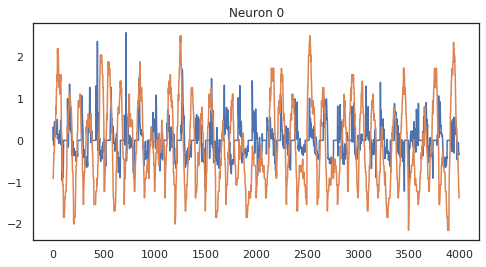

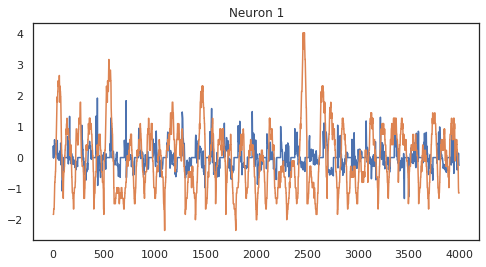

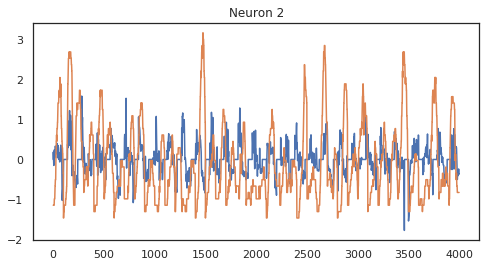

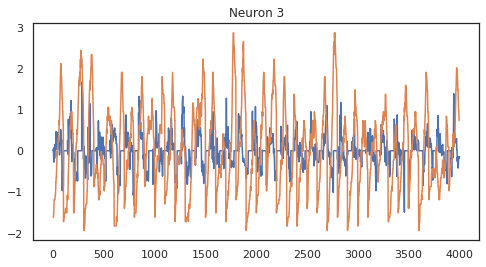

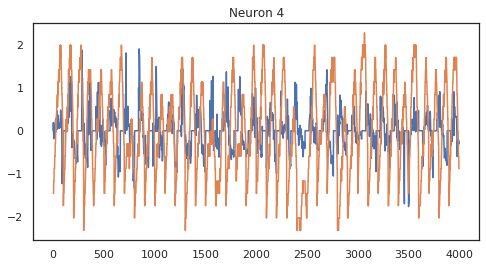

...

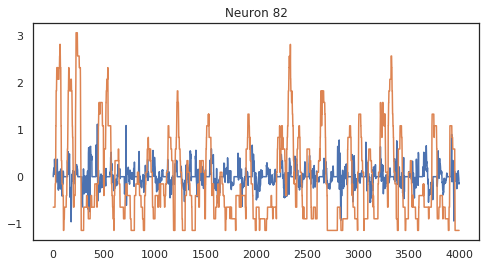

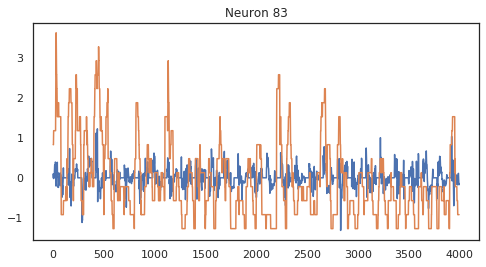

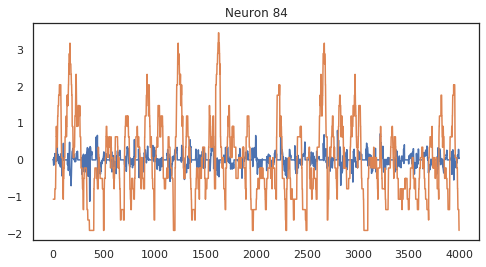

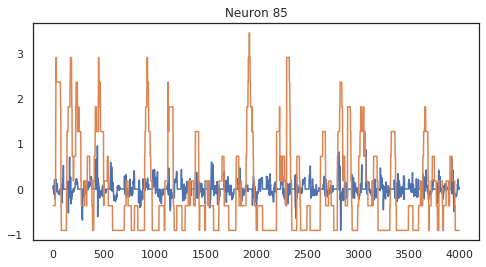

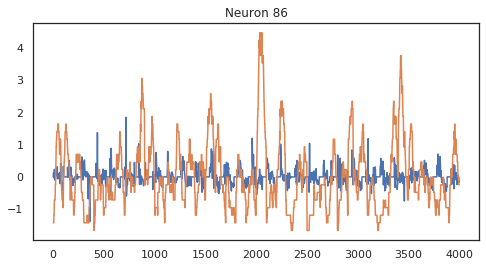

In [90]:
for n in range(y_test.shape[1]):
    plt.figure(figsize=(8,4))
    plt.title(f'Neuron {n}')
    plt.plot(y_pred[0:4000,n])
    plt.plot(y_test[0:4000,n])

(array([ 9., 10., 14., 10.,  5.,  7.,  6.,  7.,  5., 14.]),
 array([0.00125471, 0.04487273, 0.08849075, 0.13210878, 0.1757268 ,
        0.21934482, 0.26296284, 0.30658086, 0.35019888, 0.39381691,
        0.43743493]),
 <a list of 10 Patch objects>)

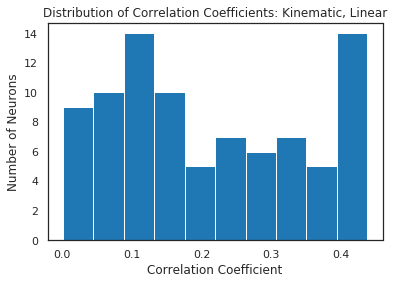

In [109]:
reg_corr = mocap_functions_copy.matrix_corr(y_pred,y_test_data)
plt.title('Distribution of Correlation Coefficients: Kinematic, Linear')
plt.ylabel('Number of Neurons')
plt.xlabel('Correlation Coefficient')
plt.hist(reg_corr)

In [51]:
neuron_corrs['kinematic_lr'] = reg_corr

## MLP

In [118]:
reg = MLPRegressor(hidden_layer_sizes=(600, 300, 100), learning_rate_init=0.0001, max_iter=1000, activation='tanh', alpha=0.001, batch_size=1000).fit(X_train_data, y_train_data)

y_pred = reg.predict(X_test_data)
reg.score(X_test_data, y_test_data)

-0.04850956063207698

Average Correlation: 0.27663536576629005
Mean Squared Error: 0.6749699337745931


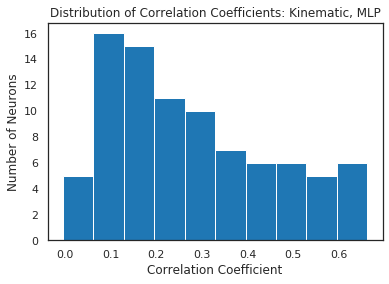

In [119]:
regression_test_corr = mocap_functions_copy.matrix_corr(y_pred, y_test_data, axis=0)
plt.title('Distribution of Correlation Coefficients: Kinematic, MLP')
plt.ylabel('Number of Neurons')
plt.xlabel('Correlation Coefficient')
plt.hist(regression_test_corr)
print(f'Average Correlation: {np.average(regression_test_corr)}')
print(f'Mean Squared Error: {mean_squared_error(y_test_data, y_pred)}')

In [96]:
neuron_corrs['kinematic_mlp'] = regression_test_corr

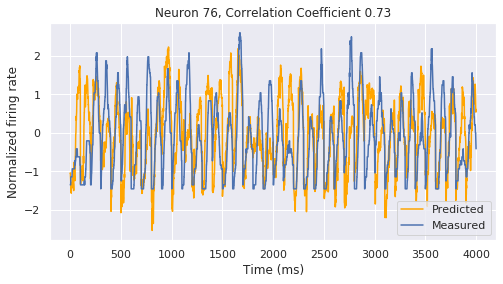

In [157]:
n = np.argmax(regression_test_corr)
fig = plt.figure(figsize=(8,4))
plt.title(f'Neuron {n}, Correlation Coefficient {round(np.max(regression_test_corr), 2)}')
plt.plot(y_pred[0:4000,n], color='orange', label='Predicted')
plt.plot(y_test[0:4000,n], color='b', label='Measured')
plt.ylabel('Normalized firing rate')
plt.xlabel('Time (ms)')
plt.legend()
fig.savefig('../figures/good_neuron.svg')

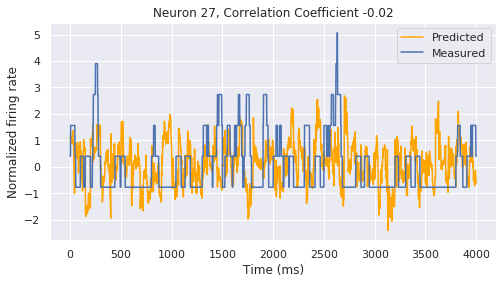

In [156]:
n = np.argmin(regression_test_corr)
fig = plt.figure(figsize=(8,4))
plt.title(f'Neuron {n}, Correlation Coefficient {round(np.min(regression_test_corr),2)}')
plt.plot(y_pred[0:4000,n], color='orange', label='Predicted')
plt.plot(y_test[0:4000,n], color='b', label='Measured')
plt.ylabel('Normalized firing rate')
plt.xlabel('Time (ms)')
plt.legend()
fig.savefig('../figures/bad_neuron.svg')

## Video and Kinematic Data (Concatenated)

In [55]:
kinematic_type = 'posData'
# Parameters
batch_size = 10000
train_params = {'batch_size': batch_size, 'shuffle': True, 'num_workers': num_cores, 'pin_memory':False}
train_eval_params = {'batch_size': batch_size, 'shuffle': False, 'num_workers': num_cores, 'pin_memory':False}
validation_params = {'batch_size': batch_size, 'shuffle': True, 'num_workers': num_cores, 'pin_memory':False}
test_params = {'batch_size': batch_size, 'shuffle': False, 'num_workers': num_cores, 'pin_memory':False}

predict_kinematics=False
# Generators
training_set = Video_Kinematic_Dataset(cv_dict,  fold, 'train_idx', video_path, kinematic_df, video_df, neural_df, offset, 
                 window_size, data_step_size, device, predict_kinematics, subsample_scalar=1, load_from_pickle=True)
training_generator = torch.utils.data.DataLoader(training_set, **train_params)
training_eval_generator = torch.utils.data.DataLoader(training_set, **train_eval_params)
X_train_data = training_set[:][0].detach().cpu().numpy()
y_train_data = training_set[:][1].detach().cpu().numpy()

validation_set = Video_Kinematic_Dataset(cv_dict,  fold, 'validation_idx', video_path, kinematic_df, video_df, neural_df, offset, 
                 window_size, data_step_size, device, predict_kinematics, subsample_scalar=1, load_from_pickle=True)
validation_generator = torch.utils.data.DataLoader(validation_set, **validation_params)

testing_set = Video_Kinematic_Dataset(cv_dict,  fold, 'test_idx', video_path, kinematic_df, video_df, neural_df, offset, 
                 window_size, data_step_size, device, predict_kinematics, subsample_scalar=1, load_from_pickle=True)
testing_generator = torch.utils.data.DataLoader(testing_set, **test_params)
X_test_data = testing_set[:][0].detach().cpu().numpy()
y_test_data = testing_set[:][1].detach().cpu().numpy()

189 149 107 169 174 82 58 17 150 179 84 130 132 112 119 118 207 153 133 96 3 102 68 126 40 49 195 35 214 193 177 115 43 164 216 50 38 53 95 203 196 92 31 54 127 19 30 23 146 85 52 172 11 26 182 48 6 47 142 77 24 89 181 87 2 13 120 27 159 213 192 113 44 175 70 122 105 202 165 56 28 42 20 143 73 103 29 147 14 160 128 155 210 183 205 104 106 57 185 78 34 67 41 215 51 131 36 9 46 98 25 204 64 121 199 180 75 188 94 114 59 

/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 32 worker processes in total. Our suggested max number of worker in current system is 1, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


117 140 69 8 65 209 167 62 101 186 148 187 99 100 170 151 197 21 1 81 10 72 137 157 39 158 88 166 168 32 208 211 91 176 194 163 97 0 79 60 93 

/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 32 worker processes in total. Our suggested max number of worker in current system is 1, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


201 90 71 144 55 198 111 83 76 5 37 86 161 61 141 173 190 200 12 156 110 135 74 171 129 145 18 178 15 206 152 7 116 63 108 139 136 134 33 125 138 212 109 184 123 16 191 80 66 22 124 45 154 4 162 

/users/loconno3/anaconda/SEE/lib/python3.7/site-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 32 worker processes in total. Our suggested max number of worker in current system is 1, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [536]:
training_set.partition

'train_idx'

In [60]:
print(X_train_data.shape)
print(y_train_data.shape)
y_pred, _ = run_lr(X_train_data, y_train_data, X_test_data, y_test_data)

(12100, 902)
(12100, 87)
-1.476138028877919


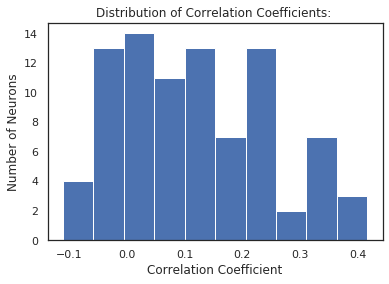

In [61]:
regression_test_corr = plot_corr(y_pred, y_test)
neuron_corrs['vid_kinematic_lr'] = regression_test_corr

-0.22624907359662738


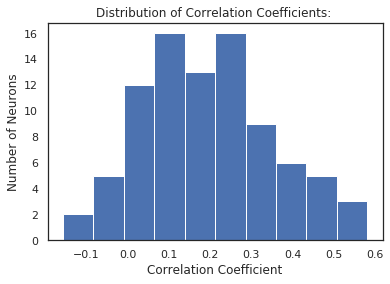

In [58]:
y_pred, _ = run_mlp(X_train_data, y_train_data, X_test_data, y_test_data)
regression_test_corr = plot_corr(y_pred, y_test)
neuron_corrs['vid_kinematic_mlp'] = regression_test_corr

# Summary Figures

In [89]:
neuron_corrs_df = pd.DataFrame.from_dict(neuron_corrs)
neuron_corrs_df.iloc[task_dependent_units]

,video_mlp
0,0.360220
1,0.395901
2,0.416660
3,0.541730
4,0.602417
...,...
76,0.653512
79,0.171003
80,0.246040
81,0.302758


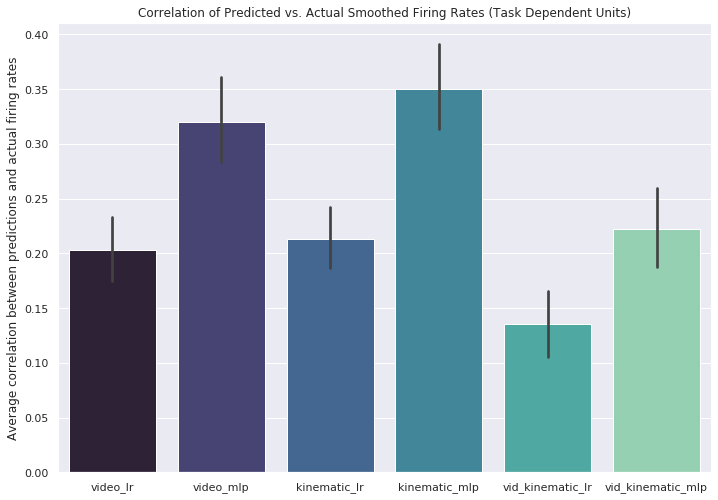

In [155]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
#MAKE LABELS BIGGER
# sns.pointplot(data=neuron_corrs_df)
sns.set_palette('mako',n_colors=None)
barplot = sns.barplot(data=neuron_corrs_df.iloc[task_dependent_units])
barplot.set(title='Correlation of Predicted vs. Actual Smoothed Firing Rates (Task Dependent Units)',ylabel='Average correlation between predictions and actual firing rates')
fig = barplot.get_figure()
fig.savefig('../figures/models_summary.svg')

In [106]:
list(neuron_corrs_df.columns)

['video_lr',
 'video_mlp',
 'kinematic_lr',
 'kinematic_mlp',
 'vid_kinematic_lr',
 'vid_kinematic_mlp']

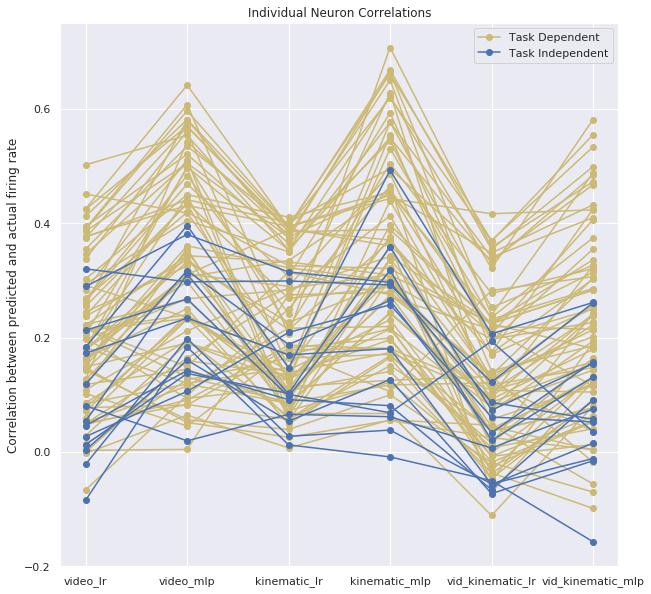

In [154]:
fig = plt.figure(figsize=(10,10))
m = np.transpose(neuron_corrs_df.to_numpy())
plt.plot(list(neuron_corrs_df.columns), m[:,task_dependent_units].reshape(6,-1), marker='o', color='y', label='Task Dependent')

mask=np.full(87,True,dtype=bool)
mask[task_dependent_units]=False
plt.plot(list(neuron_corrs_df.columns), m[:,mask], marker='o', color='b', label='Task Independent')

handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys())
plt.title('Individual Neuron Correlations')
plt.ylabel('Correlation between predicted and actual firing rate')
fig.savefig('../figures/neuron_correlations.svg')

Text(0, 0.5, 'Correlation between predicted and actual firing rate')

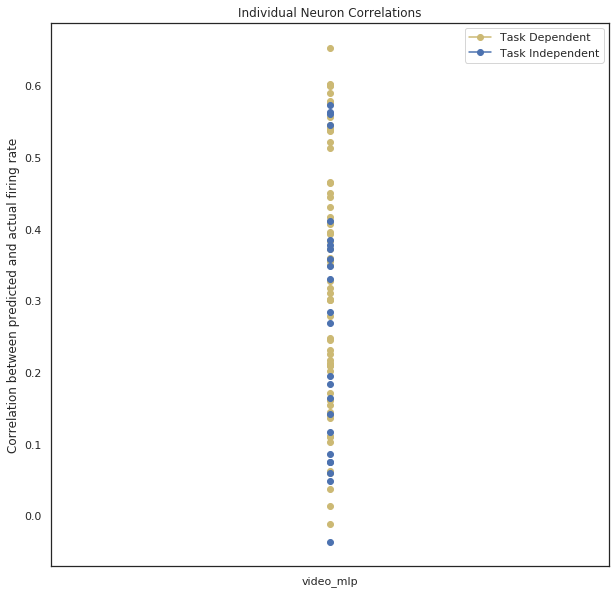

In [91]:
fig = plt.figure(figsize=(10,10))
m = np.transpose(neuron_corrs_df.to_numpy())
plt.plot(list(neuron_corrs_df.columns), m[:,task_dependent_units].reshape(1,-1), marker='o', color='y', label='Task Dependent')

mask=np.full(87,True,dtype=bool)
mask[task_dependent_units]=False
plt.plot(list(neuron_corrs_df.columns), m[:,mask], marker='o', color='b', label='Task Independent')

handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys())
plt.title('Individual Neuron Correlations')
plt.ylabel('Correlation between predicted and actual firing rate')

In [95]:
task_dependent_units

array([ 0,  1,  2,  3,  4,  8,  9, 10, 11, 12, 13, 14, 15, 17, 18, 20, 21,
       22, 23, 25, 26, 28, 29, 30, 31, 32, 33, 36, 38, 39, 40, 41, 42, 43,
       44, 45, 47, 48, 49, 51, 52, 53, 54, 56, 57, 59, 60, 61, 62, 64, 65,
       66, 68, 69, 70, 72, 73, 74, 76, 79, 80, 81, 85])

In [93]:
import scipy

In [94]:
m = np.array(list(neuron_corrs.values()))
m = np.mean(m, axis=0)
m_task_dep = m[task_dependent_units]

mask = np.ones(m.size, dtype=bool)
mask[task_dependent_units] = False
m_task_ind = m[mask]
print(f'Mean correlation task dependent: {np.mean(m_task_dep)}')
print(f'Mean correlation task independent: {np.mean(m_task_ind)}')
print(f'STD: {scipy.stats.ttest_ind(m_task_dep, m_task_ind)}')

Mean correlation task dependent: 0.32926235764421635
Mean correlation task independent: 0.27053414040768814
STD: Ttest_indResult(statistic=1.3888077298771986, pvalue=0.1685195497431602)


In [73]:
neural_list = list()
video_list = list()
for trial_idx in range(10):
    neural_list.append(neural_df[neural_df['trial'] == trial_idx]['rates'].values.squeeze())
    video_list.append(video_df[video_df['trial'] == trial_idx]['timeStamps'].values.squeeze())


Kalman Filter decoding

In [187]:
#Fit and run kalman filter
model_kf = Neural_Decoding.decoders.WienerFilterDecoder() 
model_kf.fit(X_train_data,y_train_data)

kf_train_pred = model_kf.predict(X_train_data)
kf_test_pred = model_kf.predict(X_test_data)

#Compute decoding performance
kf_train_corr = mocap_functions.matrix_corr(kf_train_pred,y_train_data)
kf_test_corr = mocap_functions.matrix_corr(kf_test_pred,y_test_data)


NameError: name 'X_train_data' is not defined

In [ ]:
%matplotlib inline
plt.imshow(kf_test_pred,aspect='auto')

: 